In [2]:
import numpy as np
from scipy.optimize import minimize_scalar
from scipy.stats import t as student_t
from scipy import integrate
from scipy.stats import norm
from sklearn.metrics import adjusted_rand_score  
import matplotlib.pyplot as plt
import math
from typing import Callable, Tuple, List, Dict, Literal, Optional

In [3]:
from tqdm import tqdm

In [103]:
from statsmodels import robust
from statsmodels.graphics.tsaplots import plot_acf

In [5]:
import matplotlib.pyplot as plt
import pandas as pd 

In [ ]:
from functions import *

## I - Data for experiments 

In [7]:

data, true_signals = generate_scenarios()


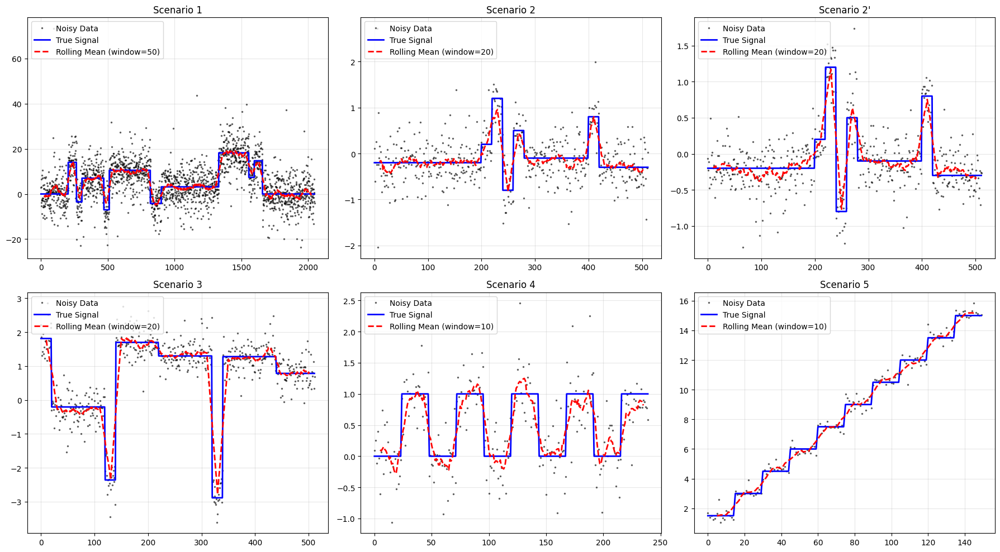

In [101]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes = axes.flatten()



# Liste des noms pour s'assurer de l'ordre

scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 

                  "Scenario 3", "Scenario 4", "Scenario 5"]



for i, name in enumerate(scenario_names):

    y = data[name]

    true_sig = true_signals[name]

    ax = axes[i]



    if len(y) < 300:

        win_size = 10

    elif len(y) > 1000:

        win_size = 50

    else:

        win_size = 20

        

    # Calcul de la moyenne mobile avec Pandas

    # center=True permet d'aligner la moyenne avec le signal (pas de décalage vers la droite)

    rolling_mean = pd.Series(y).rolling(window=win_size, center=True).mean()

    

    # Tracés

    # Les données bruitées en points gris légers

    ax.plot(y, '.', color='BLACK', markersize=3, alpha=0.5, label='Noisy Data')

    # Le vrai signal en bleu

    ax.plot(true_sig, color='blue', linewidth=2, label='True Signal')

    # La moyenne mobile en rouge pointillé

    ax.plot(rolling_mean, color='red', linestyle='--', linewidth=2, label=f'Rolling Mean (window={win_size})')

    

    ax.set_title(name)

     # On affiche la légende seulement sur le premier pour ne pas surcharger

    ax.legend(loc='upper left')

    ax.grid(True, alpha=0.3)



plt.tight_layout()

plt.show()


## II- Reproducing the experiments 

We should pick K and beta optimally as in the paper: 
$$K = \begin{cases}
                3 \hat \sigma \quad \text{for the biweight loss}, \\
                1.345 \hat \sigma \quad \text{for the huber loss}
            \end{cases} $$


Where $\hat \sigma$ is the median absolute deviation of the differenced time series. 


$$ \beta = 2 \hat \sigma^2\text{log}(n) \mathbb E(\phi(Z)^2)$$

Where $\phi$ is the gradient of the loss function and $Z \sim \mathcal N(0,1)$

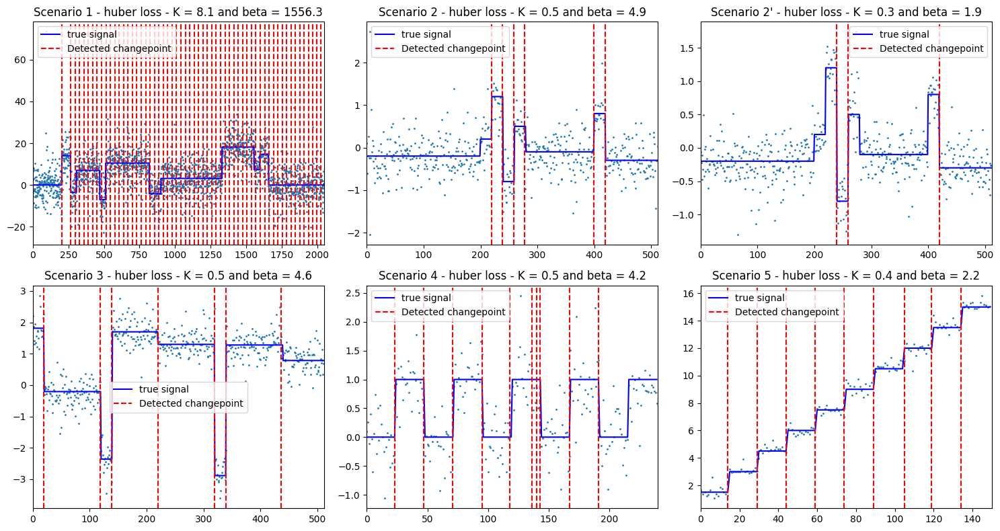

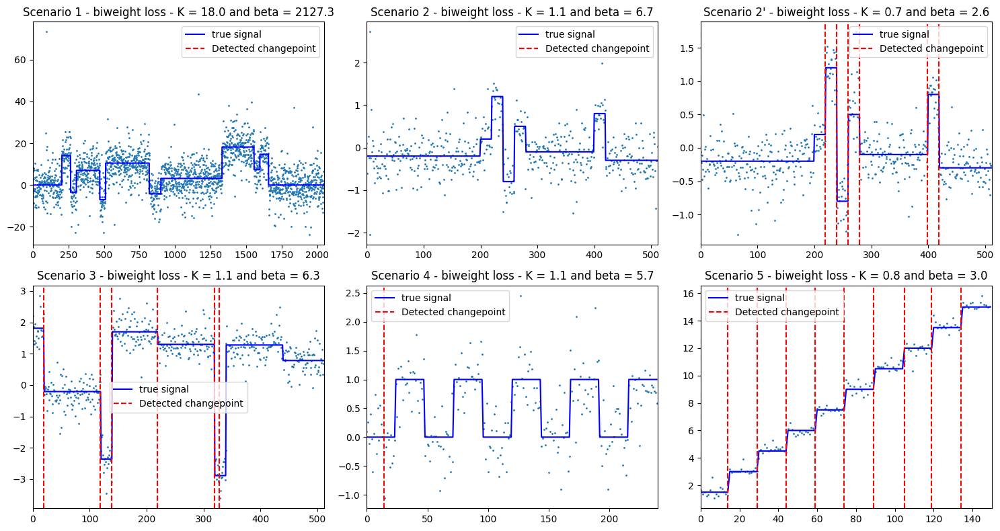

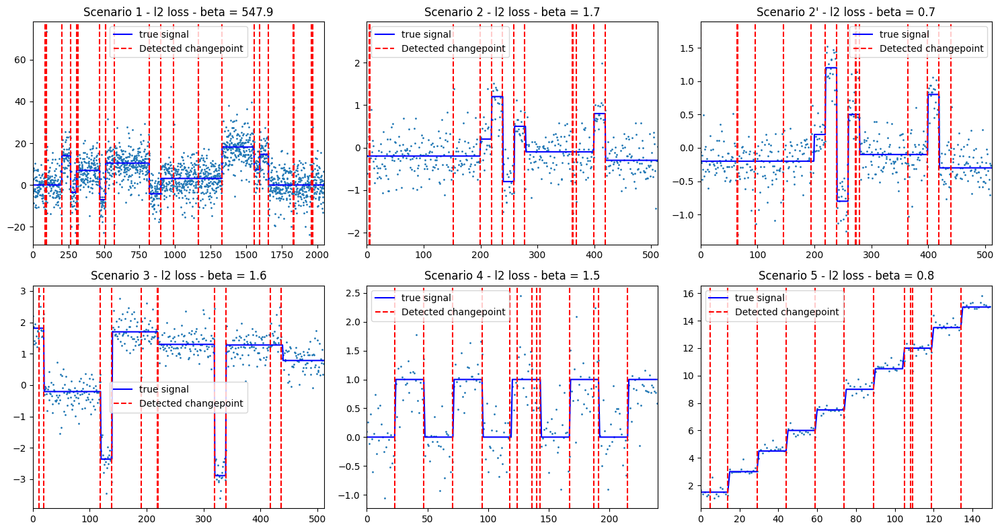

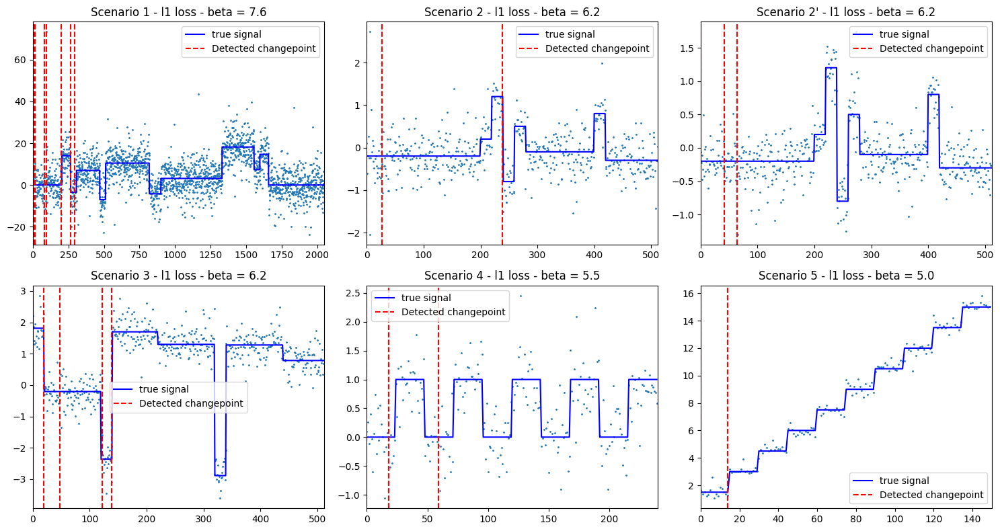

In [10]:

for loss in ['huber','biweight','l2','l1']:
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    axes = axes.flatten()



    scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 
                        "Scenario 3", "Scenario 4", "Scenario 5"]

    for i, name in enumerate(scenario_names):
        y = data[name]
        true_sig = true_signals[name]
        beta = compute_penalty_beta(y,loss)
        K=compute_loss_bound_K(y,loss)

        if loss == 'huber':
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_huber(y_t, K, t), beta)
        elif loss == 'biweight':
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_biweight(y_t, K, t), beta)
        elif loss == 'l1':
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L1(y_t, t), beta)
        else: #l2
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L2(y_t, t), beta)


        ax = axes[i]

        ax.plot(y, '.', markersize=2)
        ax.plot(true_sig, label = 'true signal',color = 'blue')
        changepoints = np.unique(cp_tau)
    
        for cp in changepoints:
            
            # On trace une ligne rouge pointillée à chaque changepoint
            ax.axvline(x=cp, color='r', linestyle='--', label='Detected changepoint' if cp == changepoints[0] else "")
        if not K:
            ax.set_title(f'{name} - {loss} loss - beta = {round(beta,1)}')
        else:
            ax.set_title(f'{name} - {loss} loss - K = {round(K,1)} and beta = {round(beta,1)}')
        ax.set_xlim(0, len(y))
        ax.legend()
        

    plt.tight_layout()
    plt.show()

Analysis of results: 
#### Huber loss
- we get overall satisfying results with the huber loss excepted on the first and third scenarios. 
- On the first scenario, there is an over segmentation phenomenon: although penalty $\beta$ is very high, the algorithm detects too many changepoints. This is because the Huber loss is unbounded and grows linearly at infinity. "For unbounded loss functions, such as [...] Huber loss, a penalised cost approach will place an outlier in a segment on its own if that outlier is sufficiently extreme". 
- On the scenario 2' we can see an under segmentation problem: we detect only 4 out of 7 outliers, while in scenario 2, which is the same but with less noise in the data, we detect 6 out of 7 outliers. In scenario 2', since there is less noise in the data, it may be more costly for the algorithm to pay the penalty $\beta$ to add new changepoints rather than pay it with the loss function (which will be lower on a given segment since outliers are not taking as extreme values as in scenario 2). 

### Biweight loss
- we get poor results on scenarios 1, 2 and 4. For these scenarios, the algorithm detects very few changepoints, because $\beta$ takes too large values (for instance $\beta = 2127$ for the scenario 1), caused by too much noise in the data. For these scenarios we need to increase $K$ (so that points above this threshold are considered as outliers) or decrease $\beta$. By doing so, we would decrease the minimum segment size $\beta/K$ and detect more changepoints.

### L2 loss
- we see an oversegmentation phenomenon on many scenarios: the algorithm detects too many changepoints: it seems we're not penalizing enough and we should increase the $\beta$ parameter to avoid that. 




We'll now try playing a bit with parameters for each loss to get better results on these scenarios.


## Biweight loss

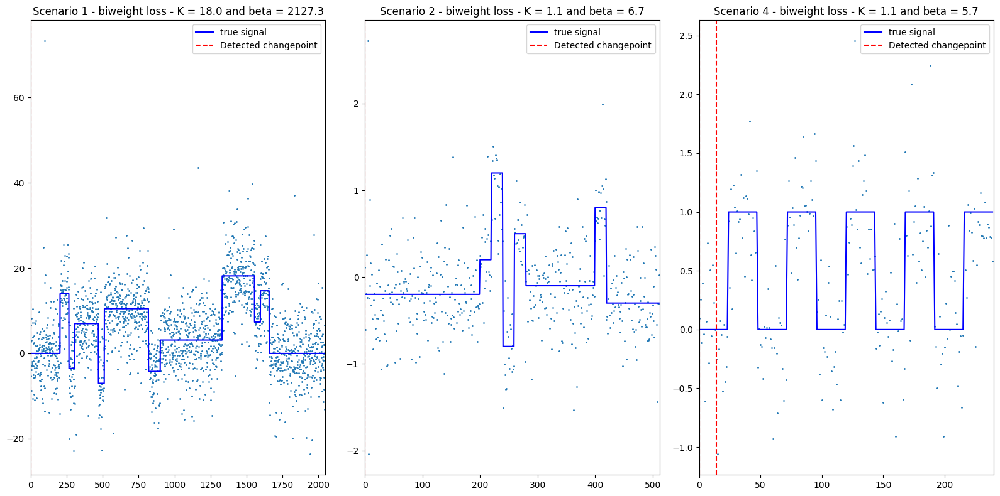

In [11]:

loss = 'biweight'
fig, axes = plt.subplots(1, 3, figsize=(16,8))
axes = axes.flatten()

scenario_names = ["Scenario 1", "Scenario 2", "Scenario 4"]  #, 
                    #"Scenario 3", "Scenario 4", "Scenario 5"]

for i, name in enumerate(scenario_names):
    y = data[name]
    
    true_sig = true_signals[name]
    beta = compute_penalty_beta(y,loss)
    K = compute_loss_bound_K(y,loss)
    

    if loss == 'huber':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_huber(y_t, K, t), beta)
    elif loss == 'biweight':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_biweight(y_t, K, t), beta)
    elif loss == 'l1':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L1(y_t, t), beta)
    else: #l2
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L2(y_t, t), beta)


    ax = axes[i]

    ax.plot(y, '.', markersize=2)
    ax.plot(true_sig, label = 'true signal',color = 'blue')
    changepoints = np.unique(cp_tau)

    for cp in changepoints:
        
        # On trace une ligne rouge pointillée à chaque changepoint
        ax.axvline(x=cp, color='r', linestyle='--', label='Detected changepoint' if cp == changepoints[0] else "")
    if not K:
        ax.set_title(f'{name} - {loss} loss - beta = {round(beta,1)}')
    else:
        ax.set_title(f'{name} - {loss} loss - K = {round(K,1)} and beta = {round(beta,1)}')
    ax.set_xlim(0, len(y))
    ax.legend()
    

plt.tight_layout()
plt.show()

Whatever we try to do when playing with parameters $\beta$ and $K$ of the biweight loss, we get very disappointing results for these 3 scenarios (very few changepoints detected). Setting a much smaller beta or higher K does not change anything. Even setting beta = 0 does not change things. I don't understand how the paper got satisfying results with this loss.

## Huber

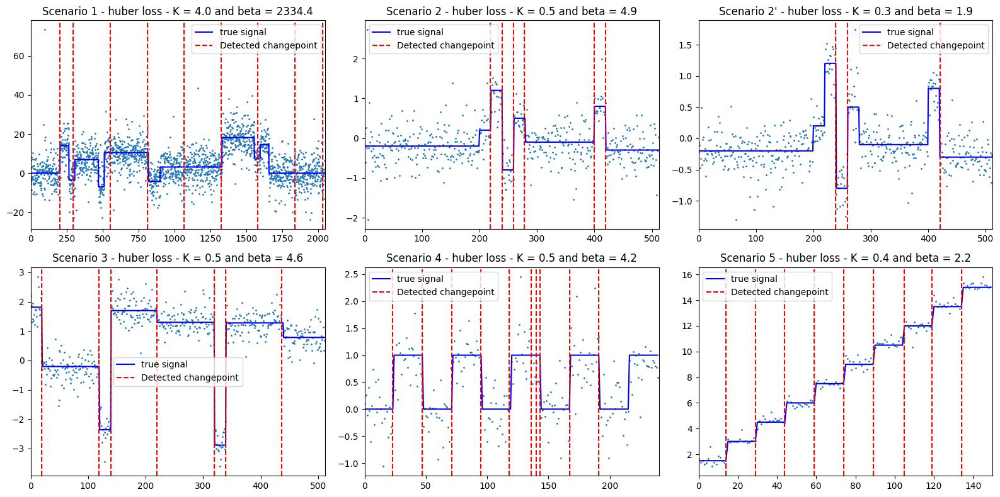

In [12]:

loss = 'huber'
fig, axes = plt.subplots(2, 3, figsize=(16,8))
axes = axes.flatten()

scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 
                    "Scenario 3", "Scenario 4", "Scenario 5"]

for i, name in enumerate(scenario_names):
    y = data[name]
    
    true_sig = true_signals[name]
    beta = compute_penalty_beta(y,loss)
    K = compute_loss_bound_K(y,loss)
    
    if name == 'Scenario 1':
        beta = 1.5*beta
        K = K/2
    

    if loss == 'huber':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_huber(y_t, K, t), beta)
    elif loss == 'biweight':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_biweight(y_t, K, t), beta)
    elif loss == 'l1':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L1(y_t, t), beta)
    else: #l2
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L2(y_t, t), beta)


    ax = axes[i]

    ax.plot(y, '.', markersize=2)
    ax.plot(true_sig, label = 'true signal',color = 'blue')
    changepoints = np.unique(cp_tau)

    for cp in changepoints:
        
        # On trace une ligne rouge pointillée à chaque changepoint
        ax.axvline(x=cp, color='r', linestyle='--', label='Detected changepoint' if cp == changepoints[0] else "")
    if not K:
        ax.set_title(f'{name} - {loss} loss - beta = {round(beta,1)}')
    else:
        ax.set_title(f'{name} - {loss} loss - K = {round(K,1)} and beta = {round(beta,1)}')
    ax.set_xlim(0, len(y))
    ax.legend()
    

plt.tight_layout()
plt.show()

Even by testing many values and scalings for the values of beta and K for scenario 1, it is difficult to get satisfying results. 

### $\ell_2$ loss

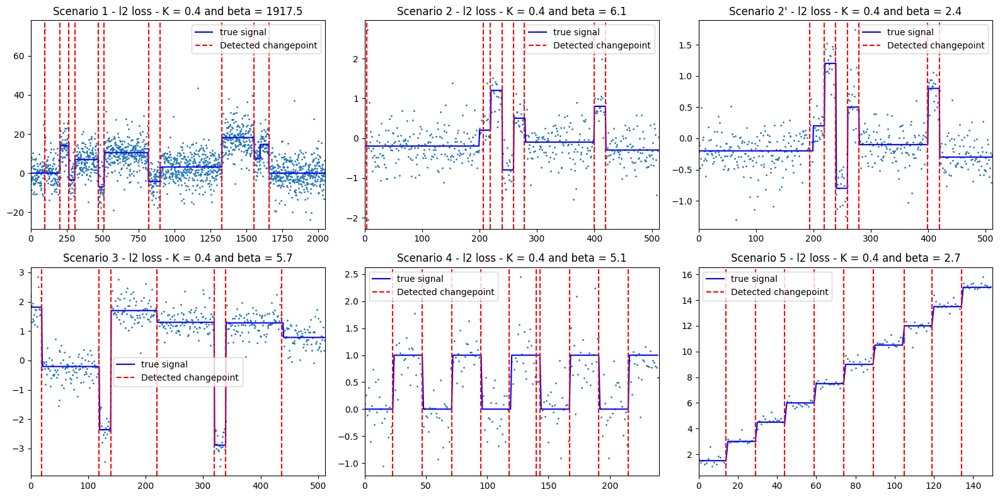

In [13]:

loss = 'l2'
fig, axes = plt.subplots(2, 3, figsize=(16,8))
axes = axes.flatten()

scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 
                    "Scenario 3", "Scenario 4", "Scenario 5"]

for i, name in enumerate(scenario_names):
    y = data[name]
    
    true_sig = true_signals[name]
    beta = compute_penalty_beta(y,loss)*3.5
    # K = compute_loss_bound_K(y,loss)
    
    

    if loss == 'huber':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_huber(y_t, K, t), beta)
    elif loss == 'biweight':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_biweight(y_t, K, t), beta)
    elif loss == 'l1':
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L1(y_t, t), beta)
    else: #l2
        cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L2(y_t, t), beta)


    ax = axes[i]

    ax.plot(y, '.', markersize=2)
    ax.plot(true_sig, label = 'true signal',color = 'blue')
    changepoints = np.unique(cp_tau)

    for cp in changepoints:
        
        # On trace une ligne rouge pointillée à chaque changepoint
        ax.axvline(x=cp, color='r', linestyle='--', label='Detected changepoint' if cp == changepoints[0] else "")
    if not K:
        ax.set_title(f'{name} - {loss} loss - beta = {round(beta,1)}')
    else:
        ax.set_title(f'{name} - {loss} loss - K = {round(K,1)} and beta = {round(beta,1)}')
    ax.set_xlim(0, len(y))
    ax.legend()
    

plt.tight_layout()
plt.show()

By adjusting manually the $\beta$ penalty (here we incrementally increased beta until getting satisfying results), we get the best results so far and don't see any oversegmentation or undersegmentation. Using the $\ell_2$ loss with a manually tuned beta (here $\beta = 2 \ \hat{\sigma}^2log(n) \cdot 3.5$ is what works best) seems to yield very satisfying results.

Moreover, from a practical perspective, using the $\ell_2$ loss is much simpler than using the biweight or huber loss as it is more interpretable, and we need to tune only one parameter and not 2.

We also struggle getting better results by adjusting manually the $\beta$ for the $\ell_1$ loss.

# Cross Validation

We cross validate beta and K to find systematically better parameters

In [15]:
# Cross-validation pour tous les scénarios avec les 4 loss functions
# Compare les résultats de la CV avec les paramètres ajustés manuellement

scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", "Scenario 3", "Scenario 4", "Scenario 5"]
losses = ['huber', 'biweight', 'l2', 'l1']

# Stocker tous les résultats
all_cv_results = {}

for scenario in scenario_names:
    print(f"\n{'='*60}")
    print(f"  {scenario}")
    print(f"{'='*60}")
    
    y = data[scenario]
    true_sig = true_signals[scenario]
    all_cv_results[scenario] = {}
    
    for loss in losses:
        print(f"\n  [{loss.upper()}] Cross-validation...")
        
        try:
            cv_result = cross_validate_rfpop(
                y=y,
                loss=loss,
                criterion='penalized_cost',
                verbose=False
            )
            
            all_cv_results[scenario][loss] = cv_result
            
            print(f"    Best beta: {cv_result['best_beta']:.4f}")
            if cv_result['best_K'] is not None:
                print(f"    Best K: {cv_result['best_K']:.4f}")
                print(f"    Best ratio (beta/K): {cv_result['best_ratio']:.2f}")
            print(f"    Changepoints detected: {cv_result['best_n_cp']}")
            print(f"    Paper params: beta={cv_result['paper_params']['beta']:.4f}", end="")
            if cv_result['paper_params']['K'] is not None:
                print(f", K={cv_result['paper_params']['K']:.4f}")
            else:
                print()
                
        except Exception as e:
            print(f"    Error: {e}")
            all_cv_results[scenario][loss] = None

print("\n" + "="*60)
print("CV COMPLETED FOR ALL SCENARIOS")
print("="*60)


  Scenario 1

  [HUBER] Cross-validation...
    Best beta: 778.1414
    Best K: 80.6182
    Best ratio (beta/K): 9.65
    Changepoints detected: 2046
    Paper params: beta=1556.2829, K=8.0618

  [BIWEIGHT] Cross-validation...
    Best beta: 1063.6253
    Best K: 8.9909
    Best ratio (beta/K): 118.30
    Changepoints detected: 2
    Paper params: beta=2127.2506, K=17.9818

  [L2] Cross-validation...
    Best beta: 273.9300
    Changepoints detected: 71
    Paper params: beta=547.8600

  [L1] Cross-validation...
    Best beta: 8.8077
    Changepoints detected: 10
    Paper params: beta=7.6246

  Scenario 2

  [HUBER] Cross-validation...
    Best beta: 13.7420
    Best K: 0.2506
    Best ratio (beta/K): 54.84
    Changepoints detected: 0
    Paper params: beta=4.9200, K=0.5011

  [BIWEIGHT] Cross-validation...
    Best beta: 3.3625
    Best K: 0.5589
    Best ratio (beta/K): 6.02
    Changepoints detected: 3
    Paper params: beta=6.7250, K=1.1177

  [L2] Cross-validation...
    Best b

/var/folders/1x/xtzy6z6d7539r5dzrvb9g6x80000gn/T/ipykernel_21731/723533007.py:35: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


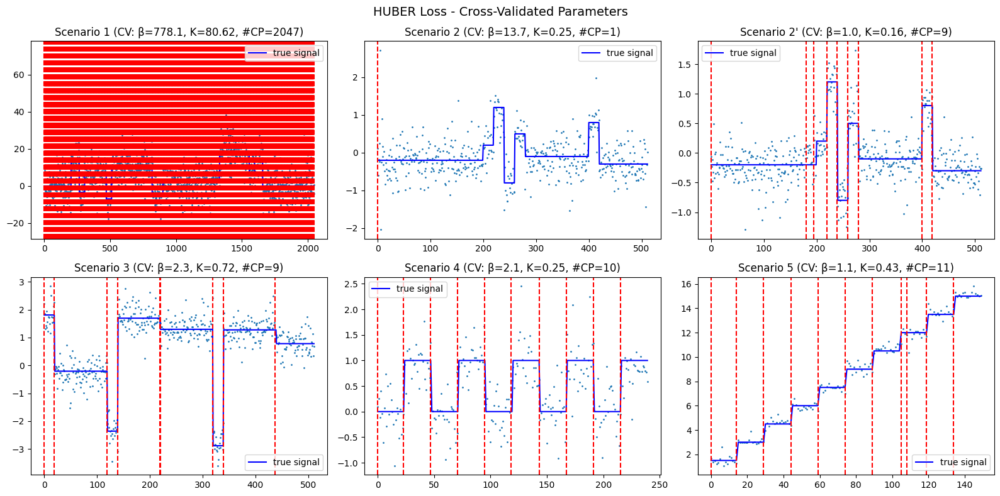

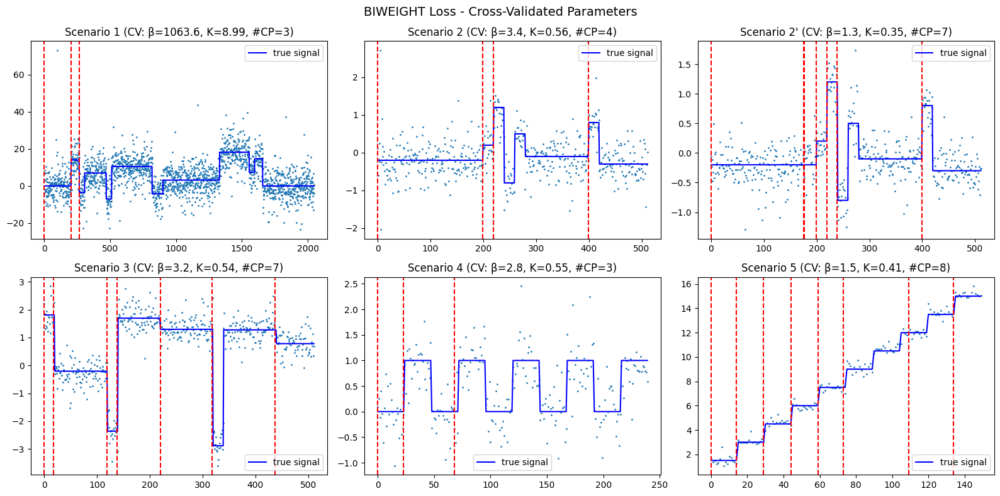

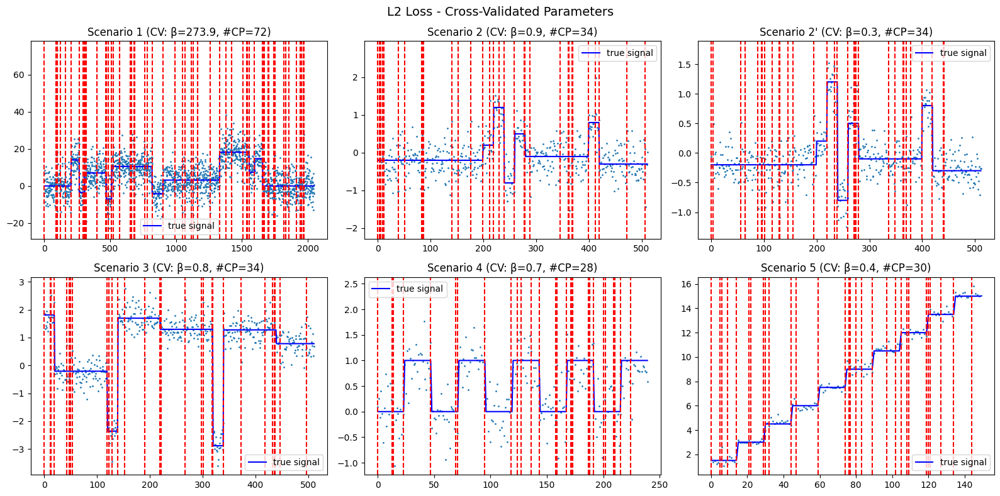

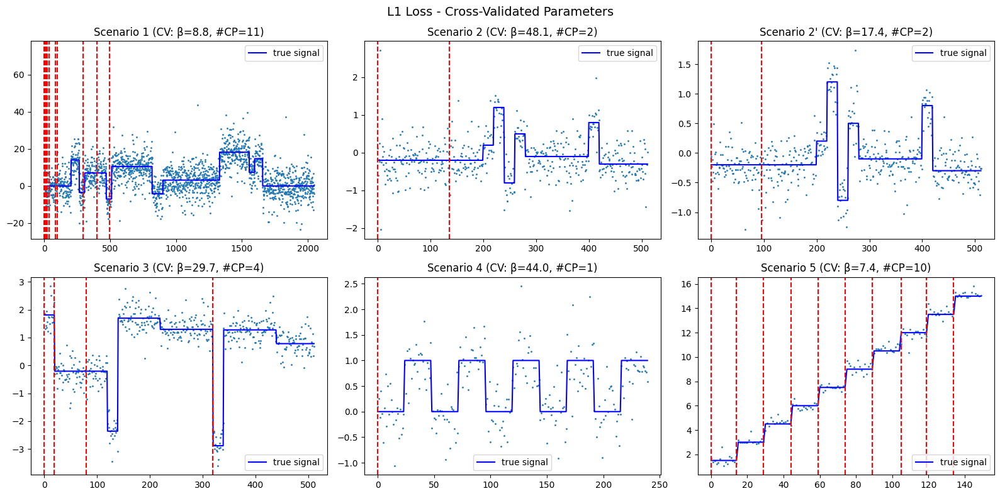

In [18]:
for loss in ['huber', 'biweight', 'l2', 'l1']:
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    axes = axes.flatten()

    scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 
                      "Scenario 3", "Scenario 4", "Scenario 5"]

    for i, name in enumerate(scenario_names):
        y = data[name]
        true_sig = true_signals[name]
        
        # Get CV results (nested dict)
        cv_result = all_cv_results[name][loss]
        changepoints = cv_result['best_changepoints']
        best_beta = cv_result['best_beta']
        best_K = cv_result.get('best_K', None)

        ax = axes[i]

        ax.plot(y, '.', markersize=2)
        ax.plot(true_sig, label='true signal', color='blue')

        for cp in changepoints:
            ax.axvline(x=cp, color='red', linestyle='--')

        # Title with CV params
        if best_K is not None:
            ax.set_title(f'{name} (CV: β={best_beta:.1f}, K={best_K:.2f}, #CP={len(changepoints)})')
        else:
            ax.set_title(f'{name} (CV: β={best_beta:.1f}, #CP={len(changepoints)})')
        
        ax.legend()

    fig.suptitle(f'{loss.upper()} Loss - Cross-Validated Parameters', fontsize=14)
    plt.tight_layout()
    plt.show()



The CV is not very satisfying... for the biweight loss it works relatively well, L2 and Huber is catastrophic, and L1 is okay-ish, but 

Elbow method tentative : try to find a stabilized number of changepoints for cross validated results with too many changepoints (especially huber and L2 losses)

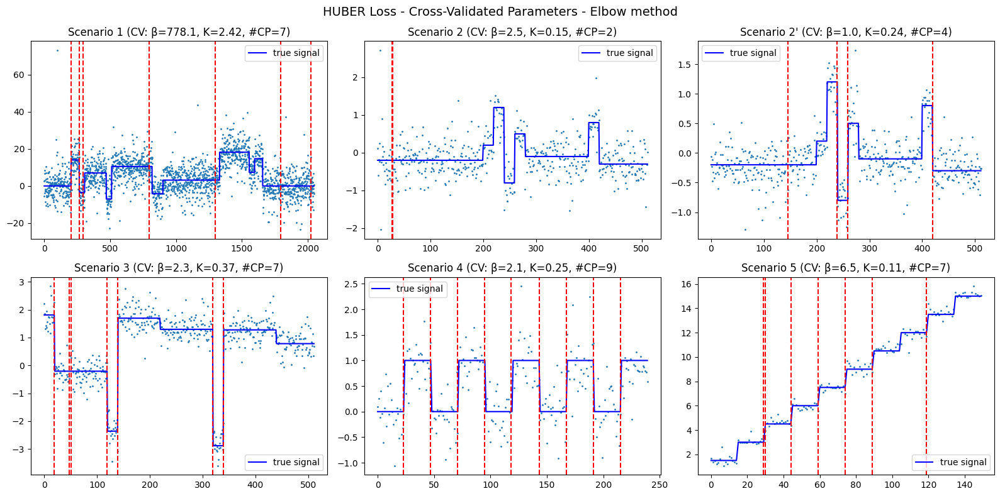

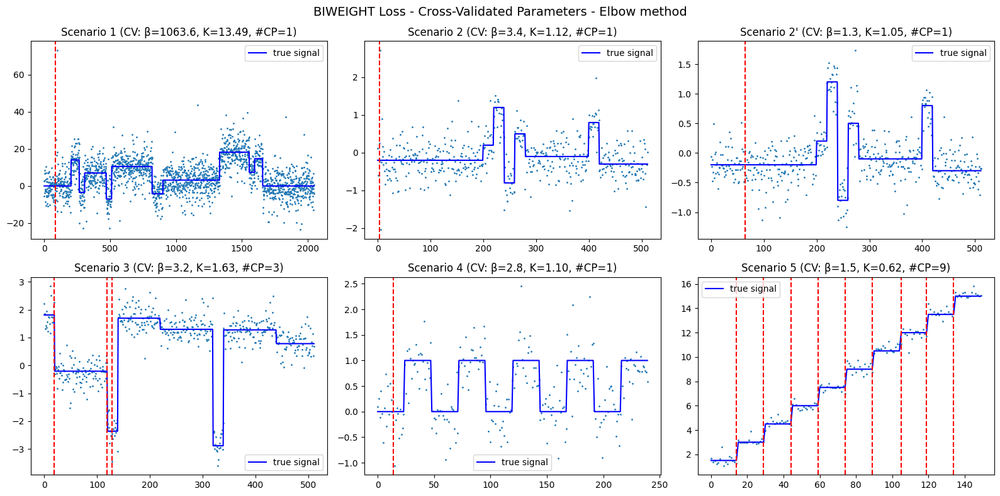

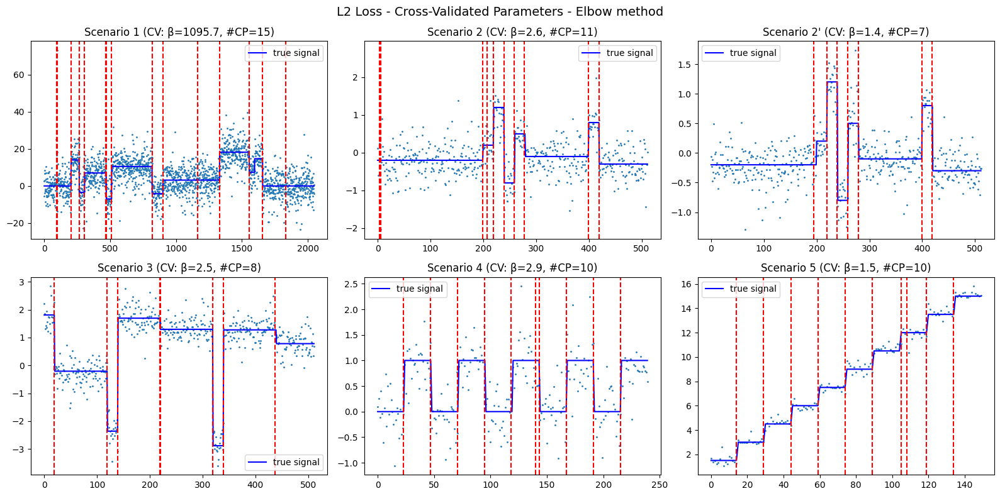

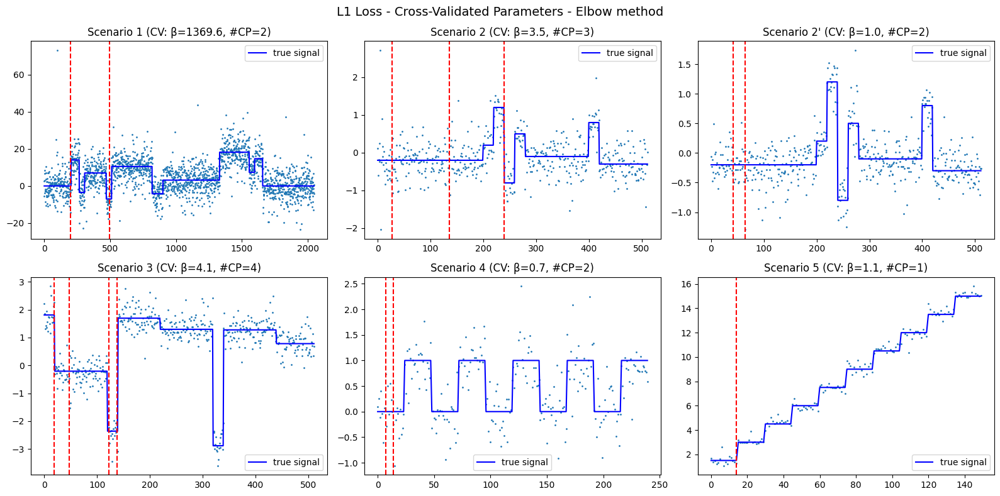

In [11]:
import pickle
with open('cv_elbow', 'rb') as handle:
    all_cv_results = pickle.load(handle)


for loss in ['huber', 'biweight', 'l2', 'l1']:
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    axes = axes.flatten()

    scenario_names = ["Scenario 1", "Scenario 2", "Scenario 2'", 
                      "Scenario 3", "Scenario 4", "Scenario 5"]

    for i, name in enumerate(scenario_names):
        y = data[name]
        true_sig = true_signals[name]
        
        # Get CV results (nested dict)
        cv_result = all_cv_results[name][loss]
        changepoints = cv_result['changepoints']
        best_beta = cv_result['best_beta']
        best_K = cv_result.get('best_K', None)

        ax = axes[i]

        ax.plot(y, '.', markersize=2)
        ax.plot(true_sig, label='true signal', color='blue')

        for cp in changepoints:
            ax.axvline(x=cp, color='red', linestyle='--')

        # Title with CV params
        if best_K is not None:
            ax.set_title(f'{name} (CV: β={best_beta:.1f}, K={best_K:.2f}, #CP={len(changepoints)})')
        else:
            ax.set_title(f'{name} (CV: β={best_beta:.1f}, #CP={len(changepoints)})')
        
        ax.legend()

    fig.suptitle(f'{loss.upper()} Loss - Cross-Validated Parameters - Elbow method', fontsize=14)
    plt.tight_layout()
    plt.show()



# Application to real data

## A) Data extraction and visualisation

In [84]:
df = pd.read_csv("economic_data_fred.csv",index_col=0)
df.index = pd.to_datetime(df.index)
df.head()

,T10Y2Y,T10Y3M,T10YFF,T5YFF,T1YFF,AAA10Y,BAA10Y,T10YIE,T5YIE,T5YIFR,DFF,VIXCLS,TEDRATE,GDPC1,CLVMNACSCAB1GQEA19,JPNRGDPEXP,CLVMNACSCAB1GQDE,UKNGDP
1947-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2182.681,NaN,NaN,NaN,NaN
1947-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2176.892,NaN,NaN,NaN,NaN
1947-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2172.432,NaN,NaN,NaN,NaN
1947-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2206.452,NaN,NaN,NaN,NaN
1948-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2239.682,NaN,NaN,NaN,NaN


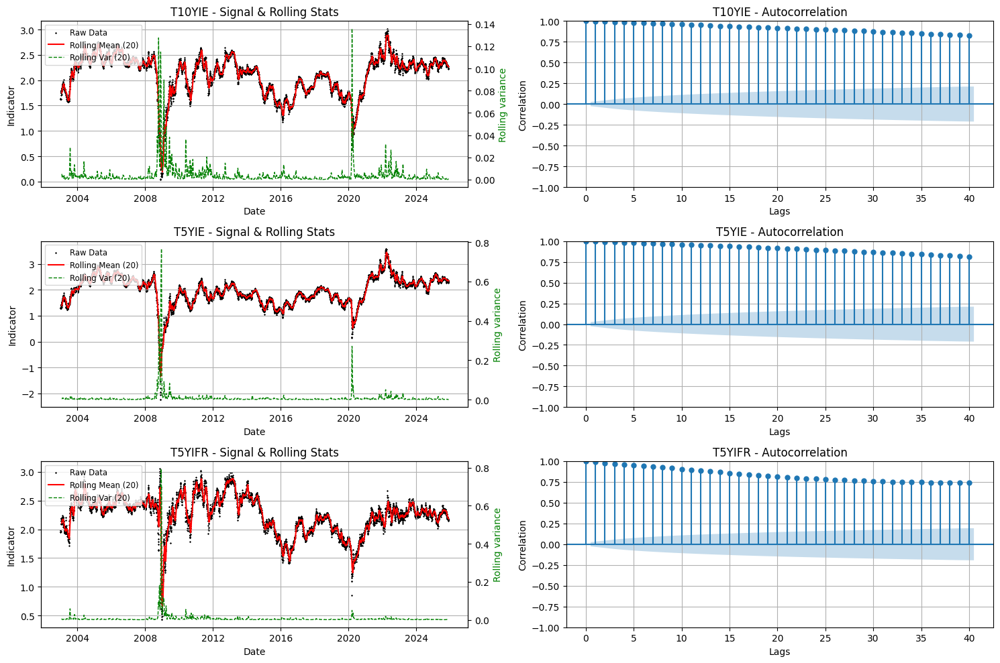

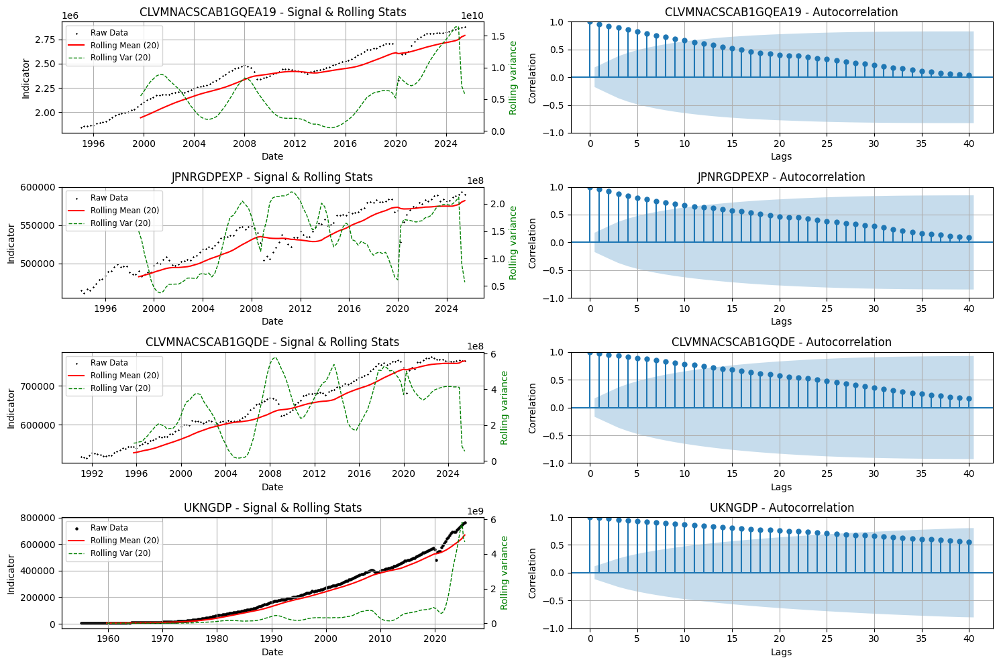

In [104]:
# List of columns

columns = [['T10YIE', 'T5YIE', 'T5YIFR'],['CLVMNACSCAB1GQEA19', 'JPNRGDPEXP', 'CLVMNACSCAB1GQDE', 'UKNGDP']]



for cols in columns:



    # Create subplots: 7 rows, 2 columns

    fig, axes = plt.subplots(nrows=len(cols), ncols=2, figsize=(15,10))



    # Define window size for rolling statistics (e.g., 20 periods)

    window_size = 20



    for i, column in enumerate(cols):

        df_filtered = df[column].dropna()

        

        # --- LEFT PLOT: Time Series + Rolling Mean + Rolling Variance ---

        ax_ts = axes[i, 0] # Select left column

        

        # 1. Plot Raw Data (Scatter)

        if i < 3:

            ax_ts.scatter(df_filtered.index, df_filtered, s=0.5, marker='x', label='Raw Data', color='black')

        else: 

            ax_ts.scatter(df_filtered.index, df_filtered, s=5, marker='o', label='Raw Data', color='black')

        

        # 2. Plot Rolling Mean (Same Y-axis)

        rolling_mean = df_filtered.rolling(window=window_size).mean()

        ax_ts.plot(df_filtered.index, rolling_mean, color='red', linewidth=1.5, label=f'Rolling Mean ({window_size})')

        

        # 3. Plot Rolling Variance (Secondary Y-axis to handle scale differences)

        ax_var = ax_ts.twinx() 

        rolling_var = df_filtered.rolling(window=window_size).var()

        ax_var.plot(df_filtered.index, rolling_var, color='green', linestyle='--', linewidth=1, label=f'Rolling Var ({window_size})')

        

        # Formatting Left Plot

        ax_ts.set_title(f"{column} - Signal & Rolling Stats")

        ax_ts.set_xlabel("Date")

        ax_ts.set_ylabel("Indicator")

        ax_var.set_ylabel("Rolling variance", color='green')

        ax_ts.grid(True)

        

        # Combine legends from both axes

        lines_1, labels_1 = ax_ts.get_legend_handles_labels()

        lines_2, labels_2 = ax_var.get_legend_handles_labels()

        ax_ts.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize='small')



        # --- RIGHT PLOT: Autocorrelation (ACF) ---

        ax_acf = axes[i, 1] # Select right column

        plot_acf(df_filtered, ax=ax_acf, lags=40, title=f"{column} - Autocorrelation")

        ax_acf.set_xlabel("Lags")

        ax_acf.set_ylabel("Correlation")

        ax_acf.grid(True)



    plt.tight_layout()

    plt.show()


We can see that there are many outliers in the data. 

## B) Changepoint detection

Important observation: when running the algorithm with values of $\beta$ and $K$ recommended by the paper, we can observe oversegmentation (or sometimes undersegmentation). 

### B)1) With values of $\beta$ and $K$ recommended by the paper

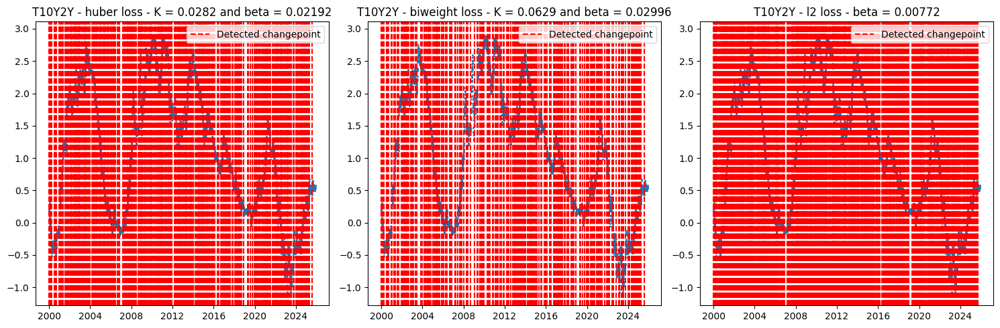

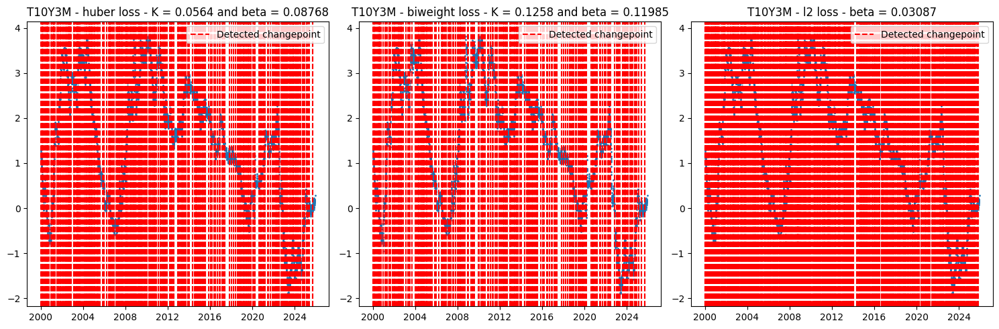

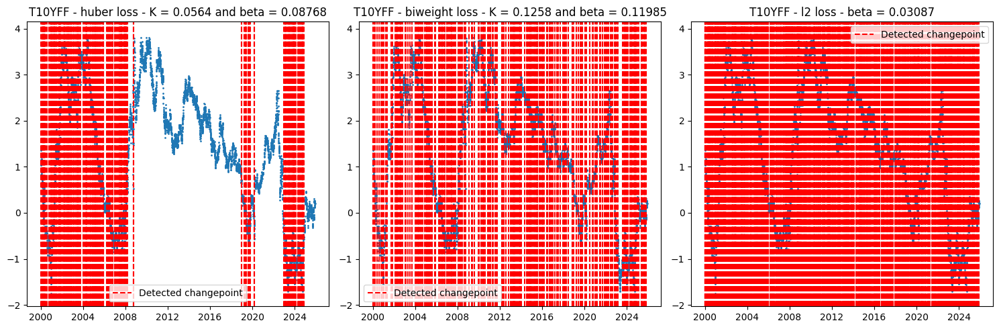

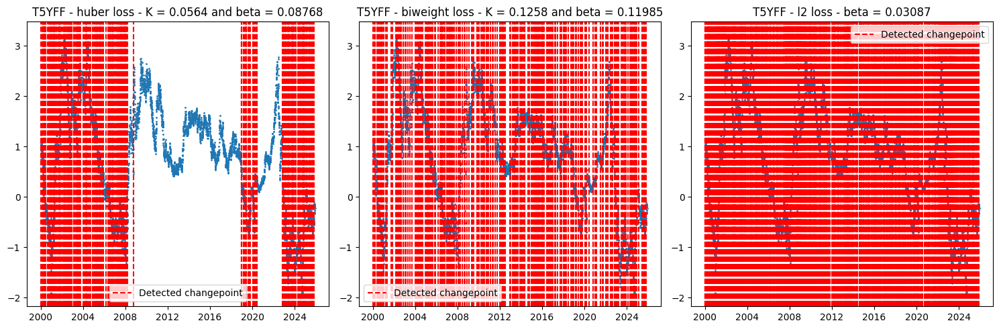

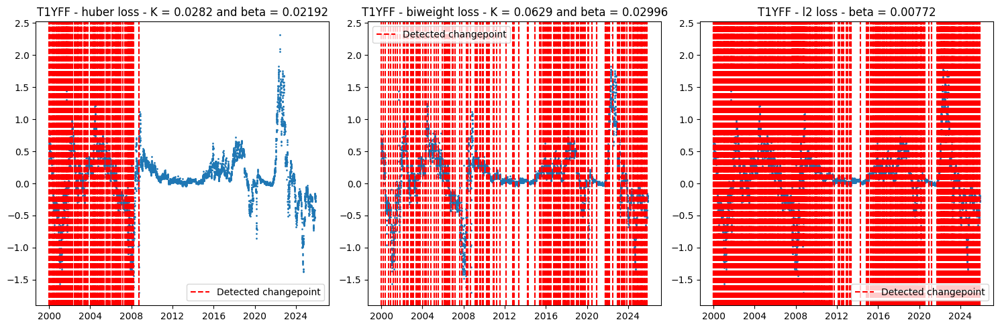

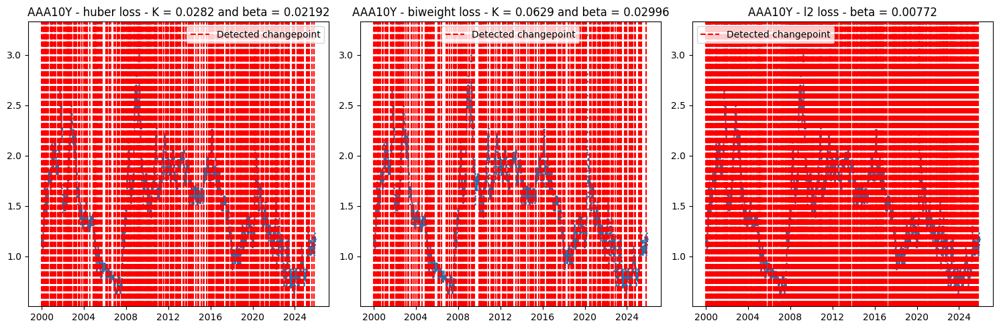

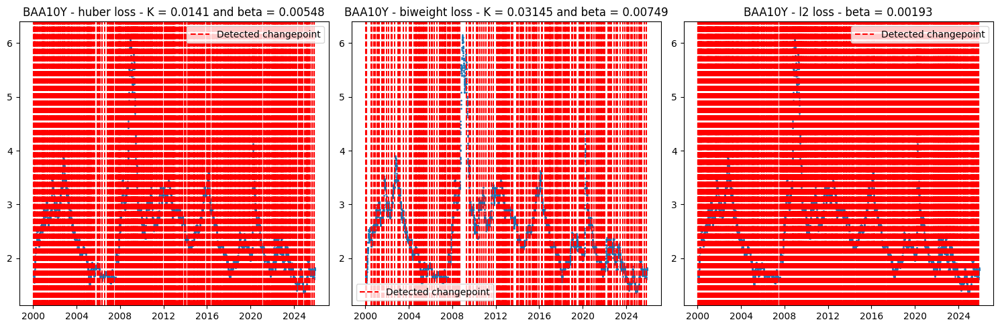

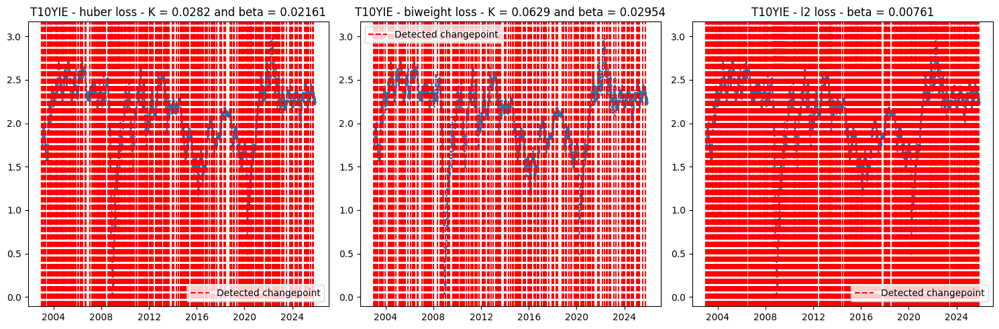

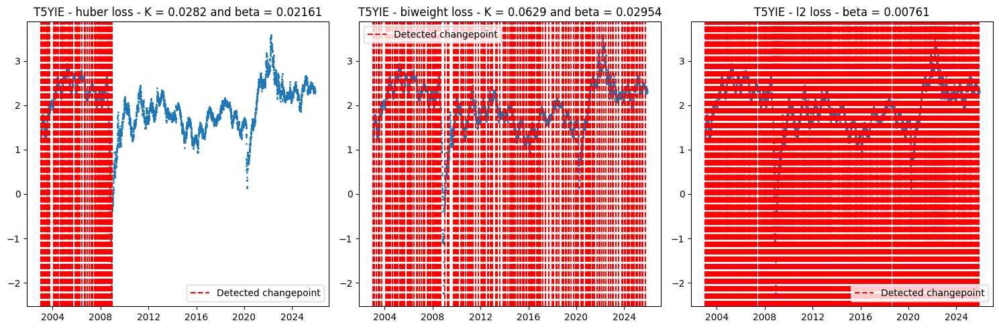

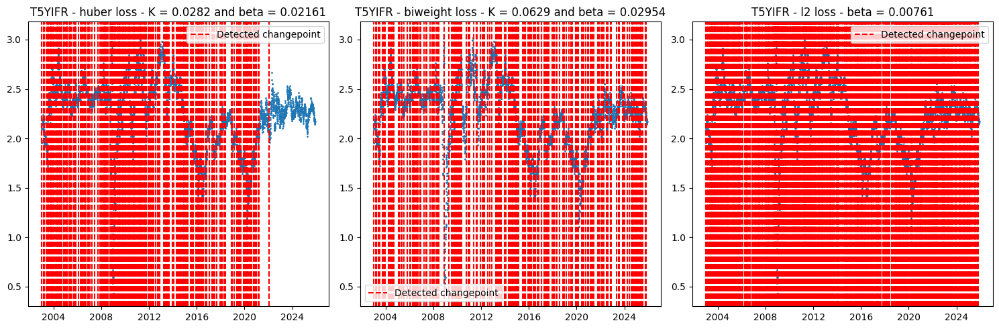

/var/folders/1x/xtzy6z6d7539r5dzrvb9g6x80000gn/T/ipykernel_15288/3446837324.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/henrifabre/opt/anaconda3/envs/dsd/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


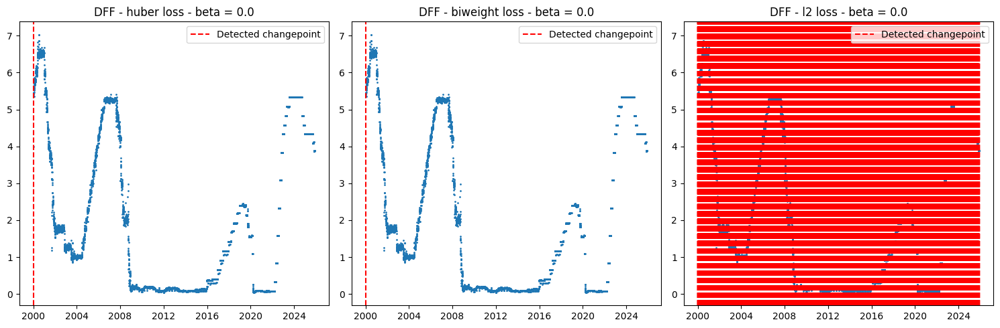

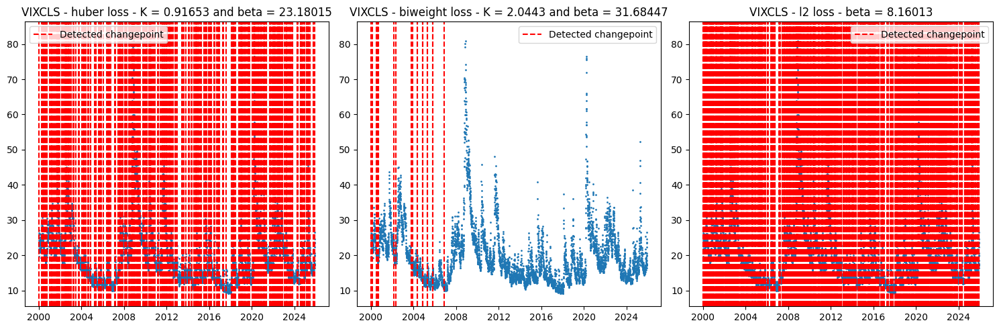

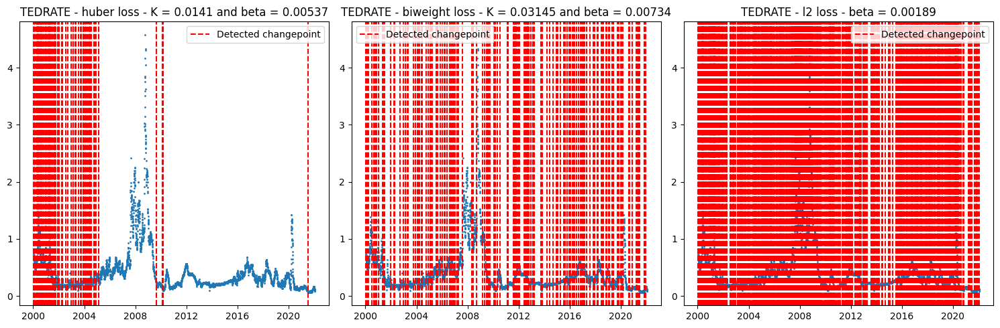

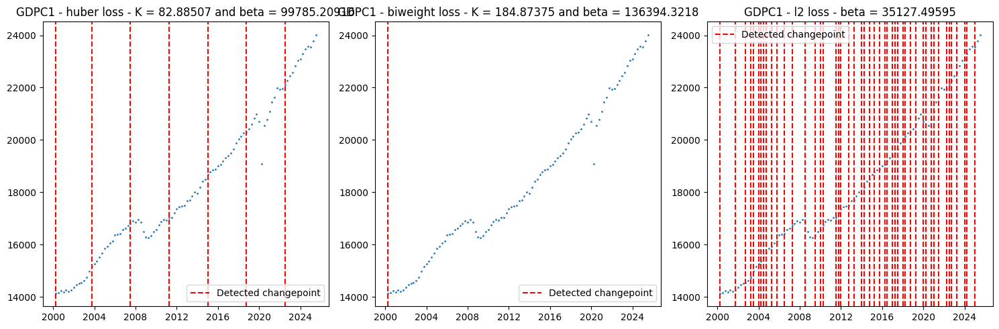

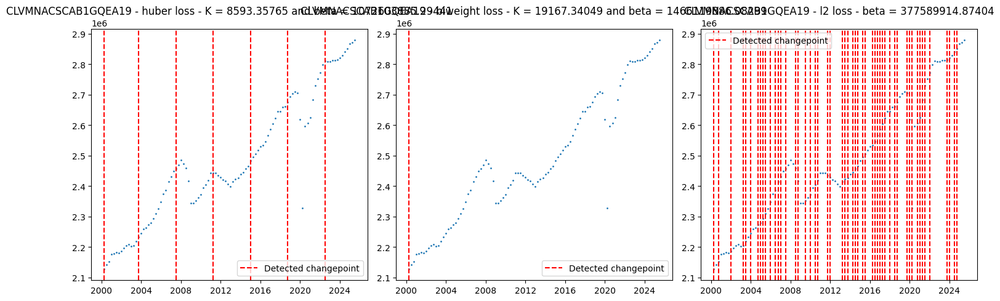

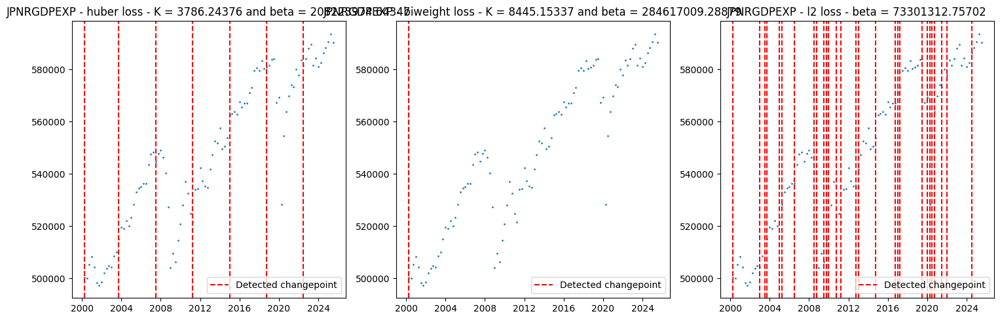

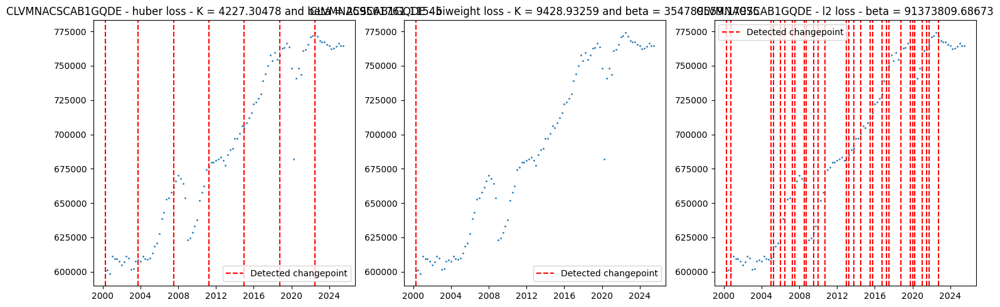

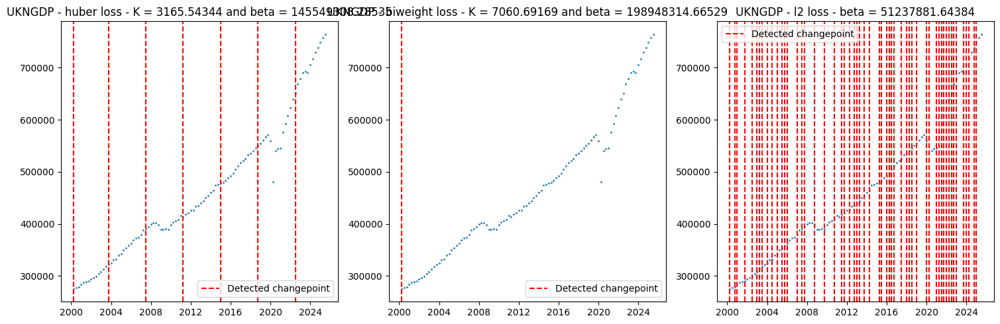

In [25]:
spreads = df.columns

for name in spreads:

    y = df[name].dropna()
    y = y[y.index>'2000']

    fig, axes = plt.subplots(1,3,figsize=(15,5))
    axes = axes.flatten()

    for i,loss in enumerate(['huber','biweight','l2']):
        
        beta = compute_penalty_beta(y,loss)
        K=compute_loss_bound_K(y,loss)
        
        


        if loss == 'huber':
            # if beta/K < len(y)/100:
            #     beta = K*len(y)/100
          
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_huber(y_t, K, t), beta)
        elif loss == 'biweight':
    
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_biweight(y_t, K, t), beta) 
        elif loss == 'l2':
 
            cp_tau, Qt_vals, Qstar_final = rfpop_algorithm1_main(y, lambda y_t, t: gamma_builder_L2(y_t, t), beta)


        ax = axes[i]

        ax.plot(y, '.', markersize=2)

        changepoints = np.unique(cp_tau)

        cp_dates = []
        for i, date in enumerate(y.index):
            if i in changepoints:
                cp_dates.append(1)
            else:
                cp_dates.append(0)

        cp_dates = pd.Series(cp_dates)
        cp_dates.index = y.index 
    
        for date in cp_dates.index:
                if cp_dates.loc[date] ==1:
            
                    # On trace une ligne rouge pointillée à chaque changepoint
                    ax.axvline(x=date, color='r', linestyle='--', label='Detected changepoint' if date == cp_dates.index[0] else "")
        if not K:
            ax.set_title(f'{name} - {loss} loss - beta = {round(beta,5)}')
        else:
            ax.set_title(f'{name} - {loss} loss - K = {round(K,5)} and beta = {round(beta,5)}')
        # ax.set_xlim(0, len(y))
        ax.legend()
        

    plt.tight_layout()
    plt.show()

### B)2) With values of $\beta$ and $K$ incrementally chosen

In [85]:
good_col = ['T5YIFR','T10YIE','AAA10Y','T5YFF','T10Y2Y',"VIXCLS","TEDRATE"]

### i) T5YIFR

0it [00:00, ?it/s]

3it [03:01, 60.54s/it]


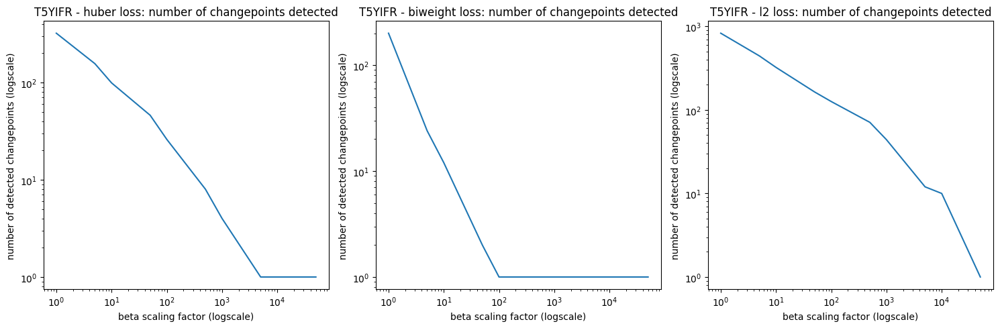

In [28]:
name = 'T5YIFR'

plot_sensitivity_tobeta(df,name)

The plots above represent the variation of number of changepoints detected by the algorithm for each loss, depending on the scaling factor of the penalty parameter (with x and y axis in logscale). For instance, when using the huber loss:
- if we use the $\beta$ recommended by the paper (beta scaling factor = 1), the algorithm will detect approximately 10^3 changepoints on the T5YIFR series. 
- if we use 10*$\beta$ (beta scaling factor = 10), the algorithm will detect approximately 100 changepoints on the T5YIFR series. 
- if we use 1000*$\beta$ (beta scaling factor =1000), the algorithm will detect approximately 5 changepoints on the T5YIFR series.

From this plot, we see that Huber and $\ell_2$ loss penalty parameter is easier to choose as it is less sensible to small variations in the scaling factor of $\beta$. This is a pro of using the Huber loss or $\ell_2$ loss compared to the biweight loss.

3it [00:11,  3.91s/it]


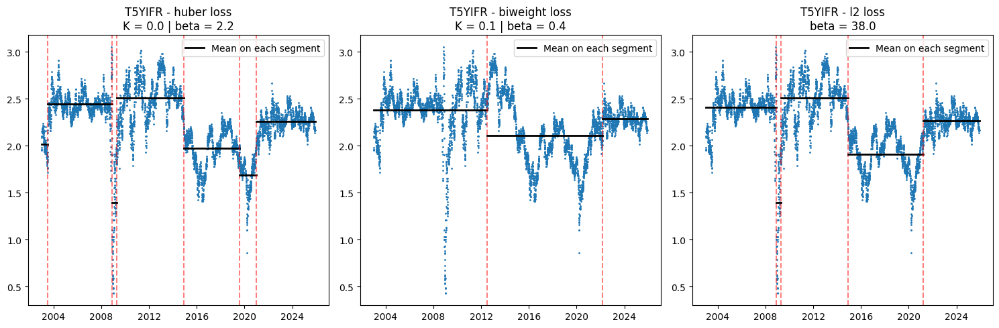

In [29]:
plot_segments(df,'T5YIFR',scaling_huber=100,scaling_biweight=12,scaling_l2=5000)

**Analysis of Structural Breaks in 5-Year Forward Inflation Expectations (T5YIFR)**

The application of the RFPOP algorithm on the T5YIFR series successfully identifies the major eras of recent US monetary history. All three loss functions detect the structural break of 2014 (the shift to a low-inflation regime) and the inflationary shock of 2021 (Post-Covid and Ukraine war inflation), validating the economic relevance of the changepoint detection algorithm on this time series.

**Comparison of Loss Functions**

* **L2 (Right) & Huber (Left) – The investor view:**
These algorithms seem to be more reactive to amplitude. They interpret the 2008 Global Financial Crisis and the 2020 COVID shock as distinct regimes. This aligns with market history, reflecting periods where investors genuinely priced in a high risk of deflation. These models capture the volatility of market fear.
* **Biweight (Center) – The economist view:**
The Biweight loss provides the most distinct interpretation: it treats the 2008 and 2020 crashes as outliers rather than structural changes. It suggests that despite the market panic in 2008, long-term inflation expectations remained structurally anchored until 2014. It filters out the noise of the COVID crisis to focus only on the trend. From a monetary policy evaluation perspective, this model is the most valuable as it distinguishes between temporary market panic (viewed as outliers) and true structural shifts in inflation anchoring.

We've seen that the biweight loss tends to penalize more and select less changepoints as it is more sensible to an increase in the size of $\beta$. Hence, the biweight loss may be more convenient to use to detect long term economic trends while L2 and huber loss are more useful to detect short term breaks. Notice that we can still get exactly the same results with all the 3 losses by playing with $\beta$.

Notice that with an appropriate $\beta$, the L2 loss gives very similar results to the Huber loss, so maybe the use of the Huber loss is not so relevant.

### ii) T10YIE

0it [00:00, ?it/s]

3it [06:17, 125.91s/it]


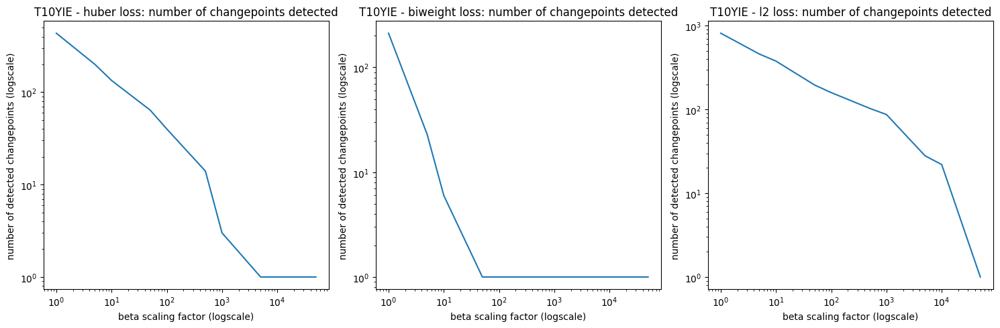

In [87]:
plot_sensitivity_tobeta(df,'T10YIE')

We see a similar sensitivity of number of changepoints as a function of the size of the penalty term: number of changepoints detected by Huber loss and $\ell_2$ loss is less sensitive to an increase in $\beta$ than number of changepoints detected by biweight loss.

3it [00:13,  4.49s/it]


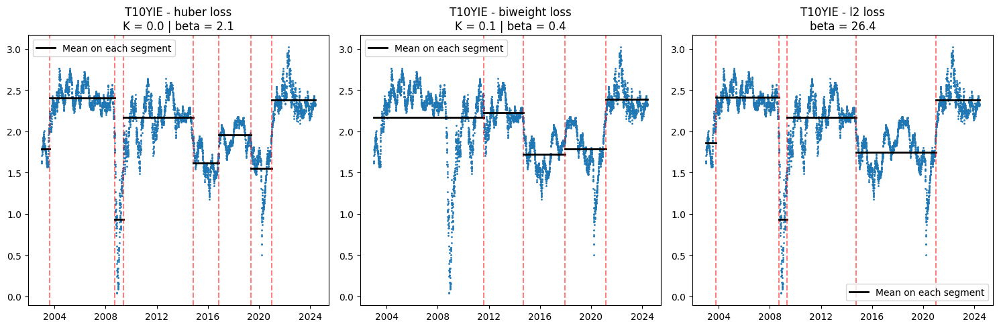

In [ ]:
plot_segments(df,'T10YIE',scaling_huber=100,scaling_biweight=14,scaling_l2=3500)

The T10YIE (10-Year Breakeven Inflation Rate) series represents the market's average inflation expectation over the next 10 years. It differs slightly from the previous series (T5YIFR) because it includes the near term (the next 5 years), making it more sensitive to immediate shocks like oil price crashes or liquidity crises.

### **Historical Analysis of Identified Regimes**

The algorithms have successfully segmented the last 20 years of US inflation history into distinct economic chapters.
- **pre-2008:** a stable plateau around 2.4%. This was an era in which markets were confident the FED had inflation perfectly under control.
- **2008: GFC liquidity crisis**. In late 2008, the TIPS (inflation-protected bonds) market suffered a liquidity crisis. Investors sold everything to get cash. This artificially depressed TIPS prices, making the Breakeven inflation Rate collapse. It wasn't necessarily that people expected 0% inflation for 10 years, but rather that the instrument measuring it was broken.
- **Period 2: 2014 - 2016: The Oil Shock**. In late 2014, oil prices crashed from $100 to $40. Since T10YIE includes near-term inflation (which is heavily driven by energy), expectations were repriced lower, from 2.4% to 1.7% on average. 
- **Period 3: Post-2021 (The Return of Inflation)**. Markets repriced a structural return to higher inflation due to fiscal stimulus after the covid crisis and supply chain shocks caused by Ukraine war. 

#### **L2 (Right) & Huber (Left): the investor's view**
- In 2008 and 2020, both algorithms create a specific, deep segment to account for the GFC and Covid crash.
- Interpretation: these models are more sensible to outliers than the biweight loss and consider short term volatility periods caused by crash as distinct regime change, however brief. This makes sense from an investor as large volatility periods are tremendously important for them. 
- L2 / Huber accurately depicted the financial stress and volatility of the market (detecting the crises).

#### **Biweight (Center): the economist view**
- The Biweight loss sees the 2008 and 2020 crashs as outliers. Instead of breaking the segment and creating a crisis regime, it chose to ignore the data points as noise and maintain the long-term anchor.
- As a result, it bridges 2005–2014 as a mostly continuous regime of stable expectations, filtering out the GFC and Covid volatility to show only the structural step-down in 2014 and the structural step-up in 2021.
- Biweight accurately depicted the fundamental economic anchor, arguing that the 2008 and 2020 market crashes were liquidity events, not fundamental shifts in long-term inflation expectations.

Once again, thanks to its larger sensitivity to size of penalty and to its propension to penalize more, the Biweight model seems more relevant to analyse economic periods without taking into account the noise of market panic.

### iii) AAA10Y

3it [03:08, 62.89s/it]


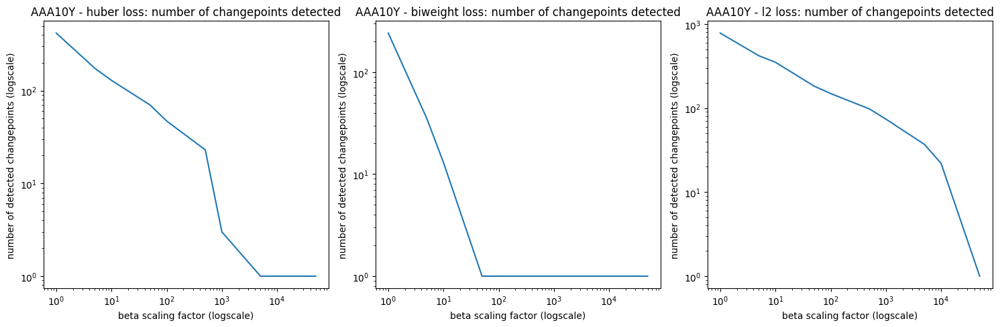

In [ ]:
plot_sensitivity_tobeta(df,'AAA10Y')

0it [00:00, ?it/s]

3it [00:17,  5.93s/it]


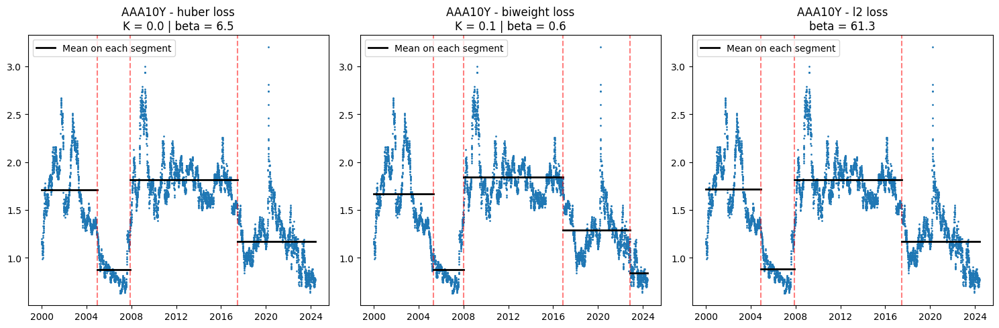

In [ ]:
plot_segments(df,'AAA10Y',scaling_huber=300,scaling_biweight=20,scaling_l2=8000)

This indicator a proxy for the Credit Spread or the risk premium on high-grade corporate debt.

### **Historical Interpretation of Regimes**

* **2000 – 2004: Post-Dotcom Risk Aversion**, characterized by high spreads. Following the Dotcom crash and the accounting scandals (Enron, WorldCom), investors demanded a high premium to hold corporate debt.
* **2004 – 2007: The "Credit Boom"**, characterized by historically low spreads (< 1.0%). This corresponds to the pre-2008 bubble. Liquidity was abundant, and investors compressed risk premiums to unsustainable lows. 
* **2008 – 2016: The Crisis & Post-Crisis "New Normal"**, characterized by another structural increase in spread. The 2008 Global Financial Crisis permanently repriced risk. Even after the panic subsided, spreads remained structurally elevated compared to 2005 due to tighter banking regulations (Basel III) and economic uncertainty (Eurozone crisis 2011).
* **2017 – Present: The Modern Low-Spread Era**, characterized by a moderate decrease (~1.2% - 1.3%). Corporate tax cuts (2017) and continued Central Bank support helped compress spreads again.

### **Comparison of Algorithms**
- The three models treat the 2008-2016 period as a single period. 
- The biweight model is the only one to create a specific period after 2024. This is a relevant split that has been commented a lot in the economic and financial news litterature recently. 

### iv) T10Y2Y

3it [04:04, 81.58s/it] 


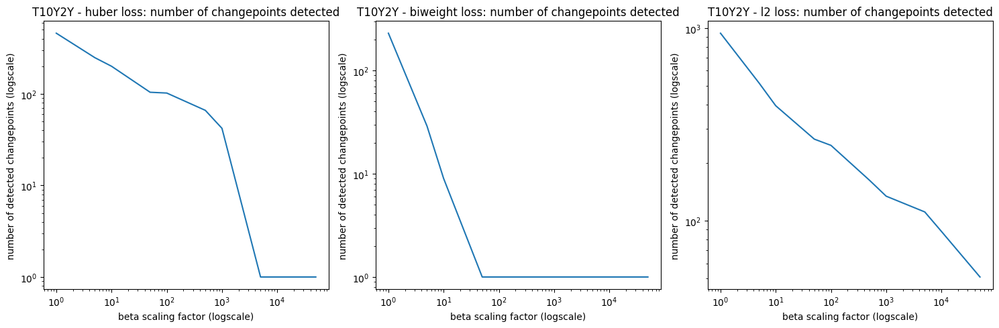

In [ ]:
plot_sensitivity_tobeta(df,"T10Y2Y")

3it [00:14,  4.91s/it]


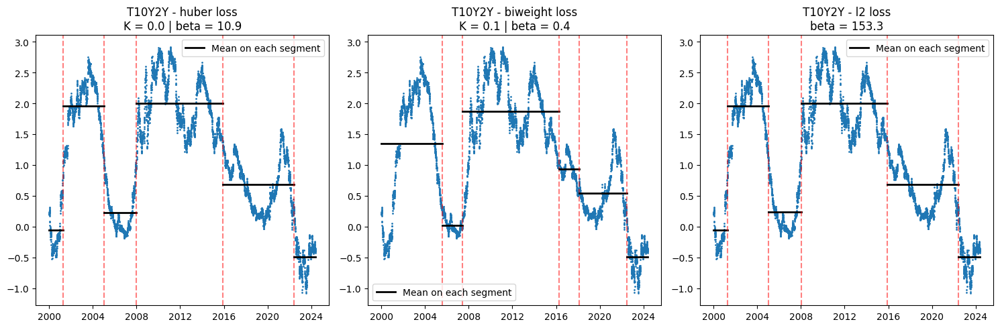

In [ ]:
plot_segments(df,'T10Y2Y',scaling_huber=500,scaling_biweight=12,scaling_l2=20000)

This indicator represents the slope of the yield curve: a steep positive slope suggests healthy economic growth expectations, while a negative slope is a predictor of an incoming recession.

### Historical Interpretation of Regimes

* **2000 – 2003: The Post-Dotcom Steepening**, characterized by a rapid shift from inversion to a steep curve. As the tech bubble burst, the Fed cut short-term rates aggressively, normalizing the curve.
* **2004 – 2007: The Pre-Crisis Inversion**, characterized by a steady flattening and eventual inversion.
* **2008 – 2016: The ZIRP Era**, characterized by a historically steep curve. With the Fed holding short-term rates at zero to stimulate recovery, the spread widened significantly as long-term yields remained higher.
* **2022 – Present: The Great Inversion**, characterized by the deepest inversion since the early 1980s. The Fed hiked rates aggressively to fight inflation resulting in Covid pandemic and Ukraine war, pushing short-term yields well above long-term yields.

### Comparison of Algorithms

* All three algorithms give similar results. The segmentation produced by the biweight loss is a bit less relevant than the other losses (no changepoint in 2003).

### v) VIXCLS

3it [10:03, 201.10s/it]


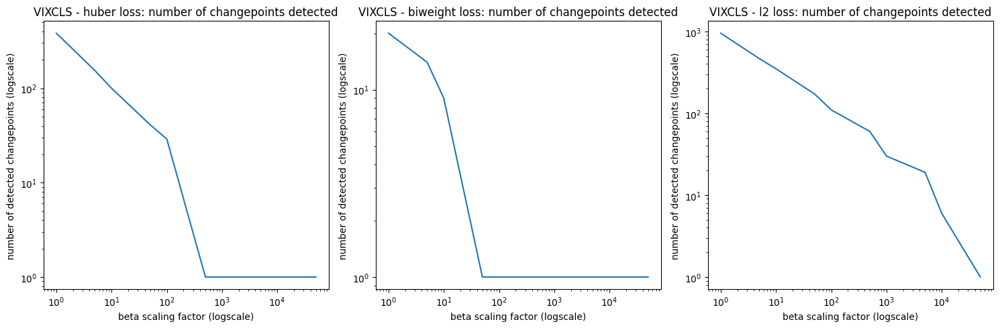

In [ ]:
plot_sensitivity_tobeta(df,'VIXCLS')

3it [00:19,  6.65s/it]


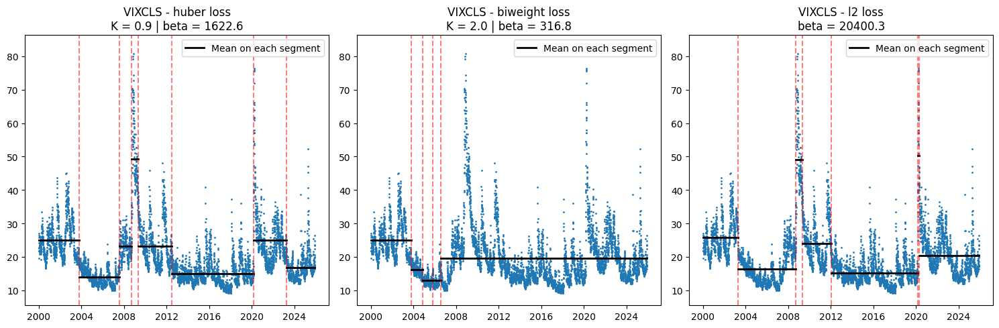

In [ ]:
plot_segments(df,'VIXCLS',scaling_huber=70,scaling_biweight=10,scaling_l2=2500)

VIXCLS acts as the "fear gauge" of the market, measuring the implied volatility of the main US index over the next 30 days.

### **Historical Interpretation of Regimes**

* **2000 – 2003: The Dotcom bubble**, characterized by elevated volatility (~25). Markets remained nervous following the tech bubble burst and the 9/11 attacks.
* **2004 – 2007: The Great Moderation**, characterized by historically low volatility (~13-15). This was the era of the "Central Bank Put" and extreme complacency before the GFC, where the VIX frequently dipped below 10.
* **2008 – 2011: The Crisis Era**, characterized by massive spikes and a high floor. The VIX hit its all-time highs during the Lehman collapse, and fear persisted through the initial Eurozone crisis.
* **2012 – 2019: low volatility period**, characterized by a return to suppressed volatility. Quantitative Easing (QE) dampened market swings. 
* **2020 – 2022**, new high volatility regime caused by Covid and Ukraine war and inflation. 
* **2023-now**, back to more reasonable levels.

### **Comparison of Algorithms**
* Huber and L2 loss model perform well and identify all these periods; we could question the relevance of the specific segment identified in 2008 (and 2020 for L2). 
* Biweight (Center):The results here are extremely poor and economically meaningless, even by trying many different penalty values. The VIX is an indicator where the outliers are the signal. By treating the massive spikes of 2008 (GFC) and 2020 (Covid) as "outliers" to be ignored, the Biweight model averages the panic of 2008 with the calm of 2017.

### **Idea: robust loss functions are ill-suited for series where extreme values represent the primary regime of interest.**

### vi) TEDRATE 

0it [00:00, ?it/s]

3it [01:03, 21.19s/it]


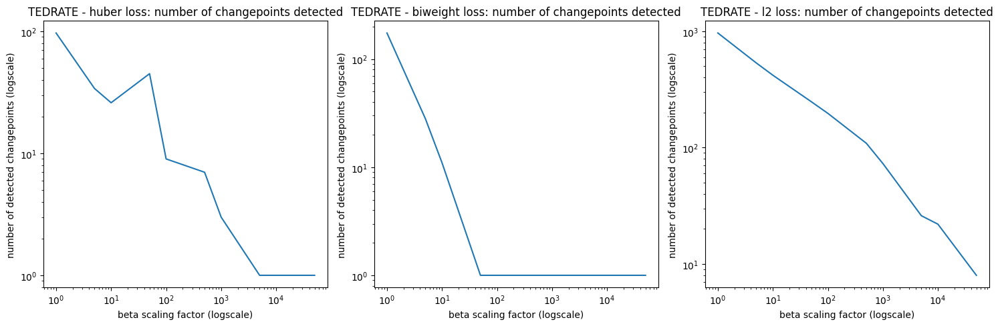

In [ ]:
plot_sensitivity_tobeta(df,'TEDRATE')

3it [00:08,  2.71s/it]


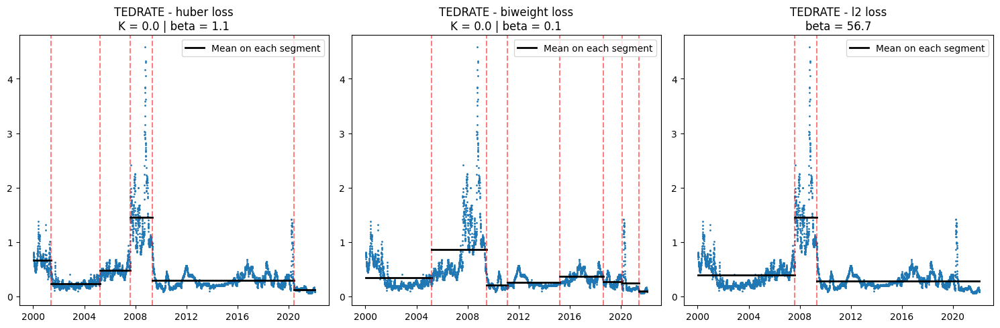

In [ ]:
plot_segments(df,'TEDRATE',scaling_huber=200,scaling_biweight=9.2,scaling_l2=30000)

The TED Spread (difference between 3-Month LIBOR and 3-Month Treasury Bill) is a gauge of perceived credit risk in the general economy and the health of the banking system. A rising spread indicates that banks believe the risk of other banks default risk is increasing.

### **Historical Interpretation of Regimes**

* **2000 – 2003: Dotcom bubble**, characterized by moderately elevated spreads. The recession following the burst of the tech bubble kept banking stress higher than average.
* **2004 – 2007: Liquidity Bubble**, characterized by very low spreads. Money was abundant in this period and banks trusted each other completely, underestimating systemic risk.
* **2008 – 2009: Global Financial Crisis (GFC)**, characterized a credit freeze. During thid period, banks stopped lending to each other, causing the spread to skyrocket to its all time high.
* **2010 – 2019: Post-Crisis Healing**, characterized by a normalization. Spreads fell back but remained structurally more volatile than before because of lack of confidence in the interbank market (Eurozone crisis created variations).
* **2020: Covid Liquidity Crunch**, characterized by a sharp spike because investors panicked and wanted to get their cash at the beginning of covid. 

### **Comparison of Algorithms**

* Huber loss algorithm effectively captures most of the periods mentioned above. L2 loss algorithm also yields decent results although the breakdown of periods could be more detailed. 
* Biweight loss algorithm yields poor results and does not properly identify breakpoints representing the 2008-2009 crisis (identifies 2005-2009 as a period instead). Because of boundedness of this loss, the extreme values in the 2008-2009 period are considered as outliers and not as characteristic values of a specific period.

### Recap of these experiments: 
- all algorithms identify relevant changepoints that make sense from an economic history perspective. We clearly identify different regimes with dates aligned with true events.
- the biweight loss algorithm is more sensitive to the value of beta: a higher beta leading to fewer changepoints, this algorithm could be more useful to ignore short term volatility (considered as outliers) and identify long term economic cycles and periods. Conversely, Huber and L2 loss algorithms are less sensitive so these algorithms can identify crashes and crisis as separate regimes.  
- however, the three algorithms can yield very similar results when picking the appropriate $\beta$ for each model. So maybe it is more relevant to stick with the L2 loss model as it is simpler and easier to use than the biweight and huber model.
- Bounded loss functions like the biweight can be ill-suited for series where extreme values represent the primary regime of interest (see VIXCLS and TEDRATE indexes).

# Cross validation on real data

In [27]:


columns_to_analyze = ['T5YIFR', 'T10YIE', 'AAA10Y', 'T10Y2Y', 'VIXCLS', 'TEDRATE']
losses = ['biweight', 'huber', 'l2']  # L2 marche mal avec outliers

# Stocker les résultats
real_data_cv_results = {}

for col in columns_to_analyze:
    print(f"\n{'='*60}")
    print(f"  {col}")
    print(f"{'='*60}")
    
    # Préparer les données
    y = df[col].dropna()
    y = y[y.index > '2000']  # Filtrer après 2000
    y_values = y.values
    
    real_data_cv_results[col] = {}
    
    for loss in losses:
        print(f"\n  [{loss.upper()}] Cross-validation...")
        
        try:
            cv_result = cross_validate_rfpop(
                y=y_values,
                loss=loss,
                verbose=False
            )
            
            # Stocker avec les dates
            cv_result['dates'] = y.index
            cv_result['y_series'] = y
            real_data_cv_results[col][loss] = cv_result
            
            print(f"    Beta: {cv_result['best_beta']:.4f} (x{cv_result['best_beta']/cv_result['paper_params']['beta']:.1f} paper)")
            if cv_result['best_K'] is not None:
                print(f"    K: {cv_result['best_K']:.4f}")
            print(f"    Changepoints: {cv_result['best_n_cp']}")
            
        except Exception as e:
            print(f"    Erreur: {e}")
            real_data_cv_results[col][loss] = None



  T5YIFR

  [BIWEIGHT] Cross-validation...


    Beta: 0.0148 (x0.5 paper)
    K: 0.0315
    Changepoints: 55

  [HUBER] Cross-validation...
    Beta: 0.0108 (x0.5 paper)
    K: 0.0141
    Changepoints: 405

  [L2] Cross-validation...
    Beta: 0.0038 (x0.5 paper)
    Changepoints: 1096

  T10YIE

  [BIWEIGHT] Cross-validation...
    Beta: 0.0148 (x0.5 paper)
    K: 0.0315
    Changepoints: 54

  [HUBER] Cross-validation...
    Beta: 0.0108 (x0.5 paper)
    K: 0.0233
    Changepoints: 553

  [L2] Cross-validation...
    Beta: 0.0038 (x0.5 paper)
    Changepoints: 1025

  AAA10Y

  [BIWEIGHT] Cross-validation...
    Beta: 0.0150 (x0.5 paper)
    K: 0.0315
    Changepoints: 74

  [HUBER] Cross-validation...
    Beta: 0.0110 (x0.5 paper)
    K: 0.0141
    Changepoints: 450

  [L2] Cross-validation...
    Beta: 0.0039 (x0.5 paper)
    Changepoints: 1051

  T10Y2Y

  [BIWEIGHT] Cross-validation...
    Beta: 0.0150 (x0.5 paper)
    K: 0.0315
    Changepoints: 60

  [HUBER] Cross-validation...
    Beta: 0.0110 (x0.5 paper)
    K: 0.0233

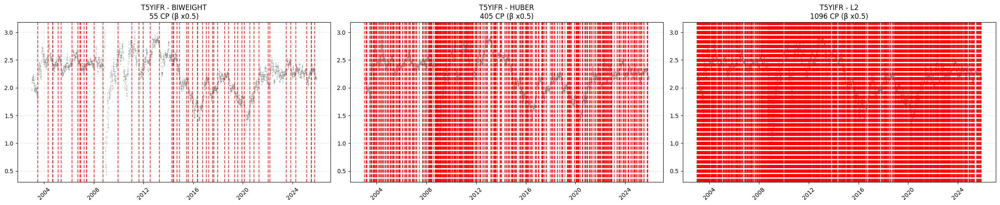

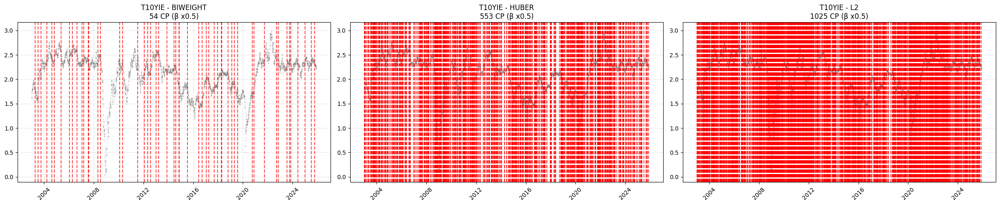

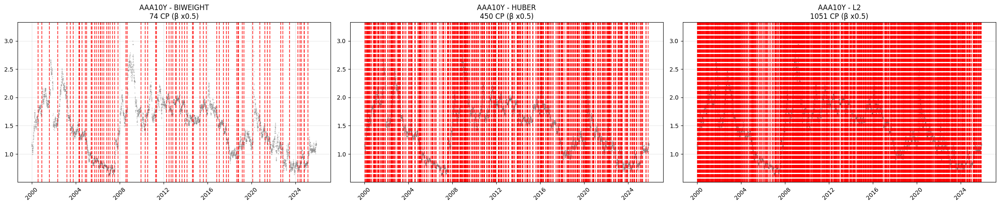

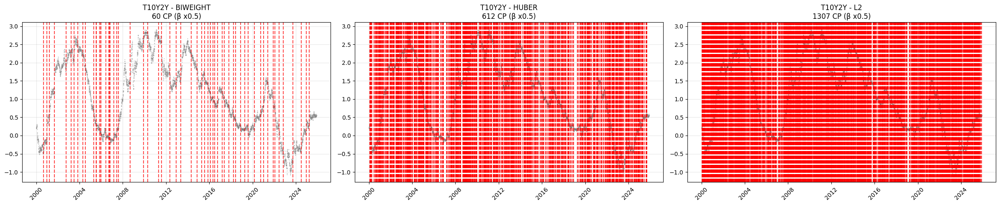

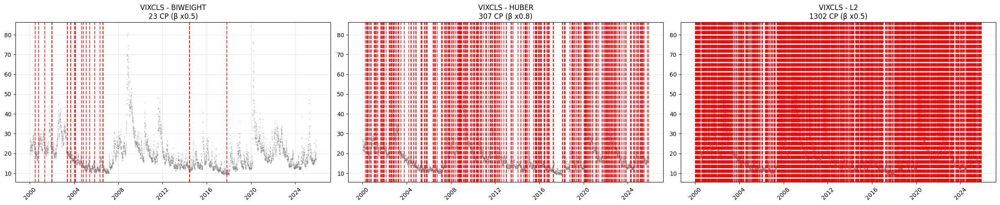

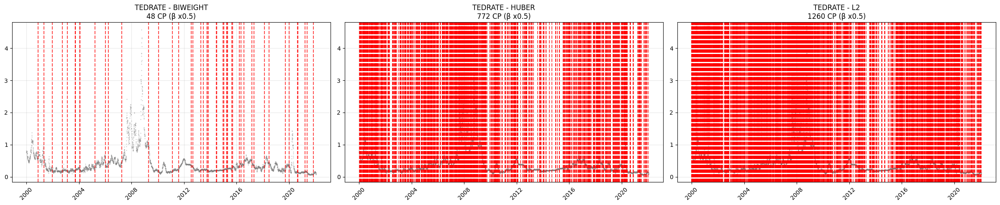

In [29]:
# =============================================================================
# PLOT DES RÉSULTATS CV SUR DONNÉES RÉELLES
# =============================================================================

for col in columns_to_analyze:
    fig, axes = plt.subplots(1, len(losses), figsize=(8*len(losses), 5))
    if len(losses) == 1:
        axes = [axes]
    
    for i, loss in enumerate(losses):
        ax = axes[i]
        cv_result = real_data_cv_results[col].get(loss)
        
        if cv_result is None:
            ax.set_title(f'{col} - {loss} (ERROR)')
            continue
        
        y = cv_result['y_series']
        changepoints = [cp for cp in cv_result['best_changepoints'] if cp > 0]
        
        # Plot série
        ax.plot(y.index, y.values, '.', markersize=1, alpha=0.5, color='gray')
        
        # Plot changepoints avec dates
        for cp in changepoints:
            if cp < len(y):
                date = y.index[cp]
                ax.axvline(x=date, color='red', linestyle='--', alpha=0.7)
        
        # Titre avec infos CV
        n_cp = cv_result['best_n_cp']
        beta_mult = cv_result['best_beta'] / cv_result['paper_params']['beta']
        ax.set_title(f'{col} - {loss.upper()}\n{n_cp} CP (β x{beta_mult:.1f})')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


## Elbow method

In [53]:

    
columns_to_analyze = ['T5YIFR']
losses = ['biweight', 'huber', 'l2']  

# Stocker les résultats
real_data_cv_results = {}

for col in columns_to_analyze:
    print(f"\n{'='*60}")
    print(f"  {col}")
    print(f"{'='*60}")
    
    # Préparer les données
    y = df[col].dropna()
    #y = y[y.index > '2000']  # Filtrer après 2000
    y_values = y.values
    
    real_data_cv_results[col] = {}
    
    for loss in losses:
        print(f"\n  [{loss.upper()}] Cross-validation...")
        
        try:
            cv_result = cross_validate_rfpop(
                y=y_values,
                loss=loss,
                criterion='elbow',
                verbose=False
            )
            
            # Stocker avec les dates
            cv_result['dates'] = y.index
            cv_result['y_series'] = y
            real_data_cv_results[col][loss] = cv_result
            
            print(f"    Beta: {cv_result['best_beta']:.4f} (x{cv_result['best_beta']/cv_result['paper_params']['beta']:.1f} paper)")
            if cv_result['best_K'] is not None:
                print(f"    K: {cv_result['best_K']:.4f}")
            print(f"    Changepoints: {cv_result['best_n_cp']}")
            
        except Exception as e:
            print(f"    Erreur: {e}")
            real_data_cv_results[col][loss] = None

print("\n" + "="*60)
print("  DONE - Résultats stockés dans real_data_cv_results")
print("="*60)



  T5YIFR

  [BIWEIGHT] Cross-validation...


    Beta: 0.0148 (x0.5 paper)
    K: 0.0189
    Changepoints: 8

  [HUBER] Cross-validation...
    Beta: 2.1614 (x100.0 paper)
    K: 0.0085
    Changepoints: 8

  [L2] Cross-validation...
    Beta: 0.0038 (x0.5 paper)
    Changepoints: 1096

  DONE - Résultats stockés dans real_data_cv_results


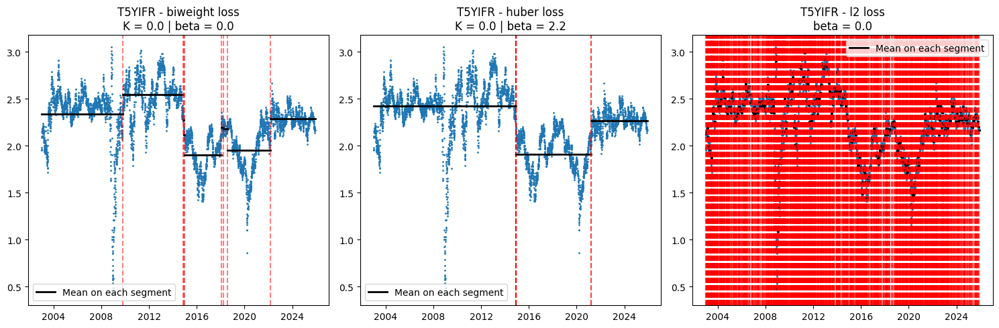

In [80]:
# =============================================================================
# PLOT DES RÉSULTATS CV SUR DONNÉES RÉELLES (style segments)
# =============================================================================

for col in columns_to_analyze:
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes = axes.flatten()
    
    for i, loss in enumerate(losses):
        ax = axes[i]
        cv_result = real_data_cv_results[col].get(loss)
        
        if cv_result is None:
            ax.set_title(f'{col} - {loss} (ERROR)')
            continue
        
        y = cv_result['y_series']
        best_beta = cv_result['best_beta']
        best_K = cv_result.get('best_K')
        
        # Plot données
        ax.plot(y, '.', markersize=2)
        
        # Construire les segments à partir des changepoints
        changepoints = sorted([0] + [cp for cp in cv_result['changepoints'] if cp > 0] + [len(y) - 1])
        
        # Calcul de la moyenne de chaque segment
        for j in range(len(changepoints) - 1):
            start_idx = changepoints[j]
            end_idx = changepoints[j + 1]
            
            segment_data = y.iloc[start_idx : end_idx + 1]
            seg_mean = segment_data.mean()
            
            # Récupération des dates pour l'axe X
            date_start = y.index[start_idx]
            date_end = y.index[end_idx]
            
            ax.plot([date_start, date_end], [seg_mean, seg_mean], 
                    color='black', linewidth=2, label='Mean on each segment' if j == 0 else "")
            
            # Ligne verticale pour le changepoint (sauf le dernier)
            if end_idx < len(y) - 1:
                ax.axvline(x=date_end, color='r', linestyle='--', alpha=0.5)
        
        # Titre
        if loss == 'l2':
            ax.set_title(f'{col} - {loss} loss\nbeta = {round(best_beta, 1)}')
        else:
            ax.set_title(f'{col} - {loss} loss\nK = {round(best_K, 1)} | beta = {round(best_beta, 1)}')
        
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax.legend(by_label.values(), by_label.keys())
    
    plt.tight_layout()
    plt.show()


# IV - Online Analysis 

The RFPOP algorithm is inherently **online**: it processes data sequentially and can detect changepoints in real-time as new observations arrive. This section demonstrates this capability on Federal Reserve interest rate data, which is relevant for detecting monetary policy regime changes.

Key monetary policy regime changes we might expect to detect:
- **2001**: Dot-com bubble burst, aggressive rate cuts
- **2007-2008**: Financial crisis, rates cut to near zero
- **2015-2018**: Rate normalization period
- **2020**: COVID-19 crisis, emergency rate cuts
- **2022-2023**: Aggressive rate hikes to combat inflation

### a) Yield curve

Série: T10Y2Y, n = 6481
Beta paper: 0.0300
Beta utilisé (x12): 0.3596
K: 0.0629


Online analysis (biweight):   1%|          | 4/322 [00:00<00:26, 12.07it/s]

Online analysis (biweight): 100%|██████████| 322/322 [44:31<00:00,  8.30s/it]


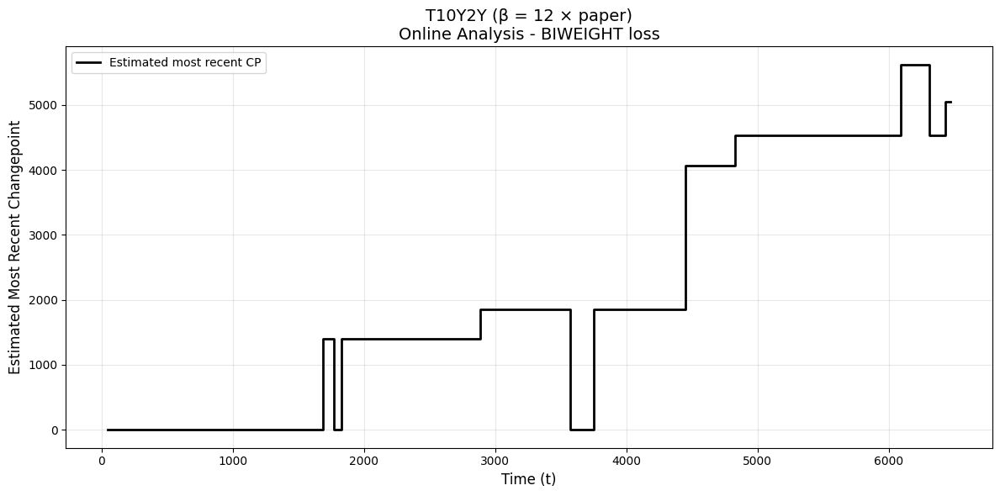

In [59]:
# =============================================================================
# ONLINE ANALYSIS - T10Y2Y (Yield Curve) avec beta x12
# =============================================================================

col = 'T10Y2Y'

# Préparer les données
y = df[col].dropna()
y = y[y.index > '2000']

print(f"Série: {col}, n = {len(y)}")

# Calculer beta et K avec le scaling
beta_paper = compute_penalty_beta(y.values, 'biweight')
K = compute_loss_bound_K(y.values, 'biweight')

beta = 12 * beta_paper  # scaling_biweight = 12

print(f"Beta paper: {beta_paper:.4f}")
print(f"Beta utilisé (x12): {beta:.4f}")
print(f"K: {K:.4f}")

# Online analysis
online_result = online_most_recent_changepoint(
    y.values,
    loss='biweight',
    beta=beta,  # Beta avec scaling
    K=K,
    step=20,
    min_obs=50
)

# Plot style papier
plot_most_recent_changepoint(
    online_result,
    title=f"{col} (β = 12 × paper)"
)




True changepoints: [1393, 1857, 4066, 4530, 5047]


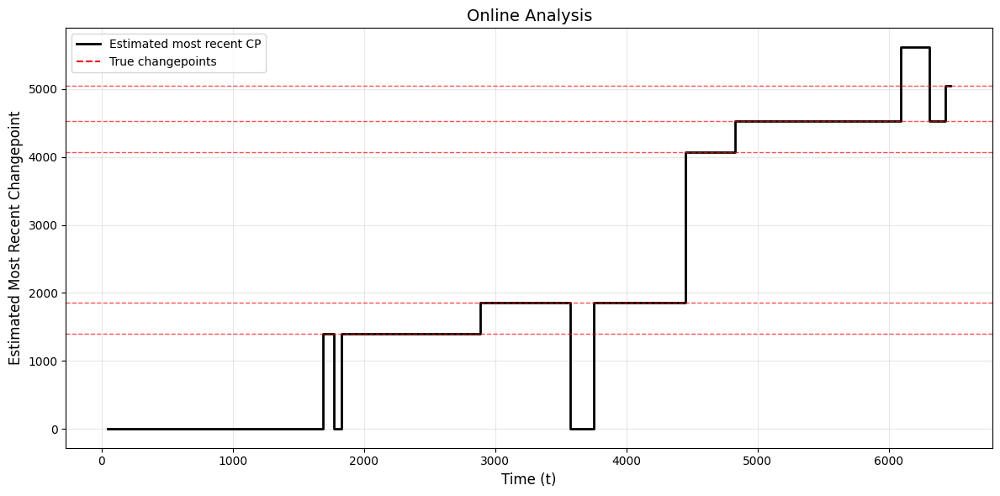

In [64]:
# 1. Obtenir les "vrais" changepoints (algo sur données complètes)
beta_paper = compute_penalty_beta(y.values, 'biweight')
K = compute_loss_bound_K(y.values, 'biweight')
beta = 12 * beta_paper  # ou le scaling que tu utilises

gamma_builder = lambda y_t, t, K=K: gamma_builder_biweight(y_t, K, t)
cp_tau, _, _ = rfpop_algorithm1_main(list(y.values), gamma_builder, beta)

# Extraction des changepoints
true_changepoints = []
idx = len(y) - 1
while idx > 0:
    tau = cp_tau[idx]
    if tau > 0:
        true_changepoints.append(tau)
    idx = tau
true_changepoints = sorted([cp for cp in true_changepoints if cp > 0])

print(f"True changepoints: {true_changepoints}")

# 2. Plot lissé avec vrais changepoints
t_vals = online_result['t_values']
recent_cp = online_result['most_recent_cp']

fig, ax = plt.subplots(figsize=(12, 6))
ax.step(t_vals, recent_cp, where='post', linewidth=2, color='black', 
        label='Estimated most recent CP')

for cp in true_changepoints:
    ax.axhline(y=cp, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.plot([], [], color='red', linestyle='--', label='True changepoints')

ax.set_xlabel('Time (t)', fontsize=12)
ax.set_ylabel('Estimated Most Recent Changepoint', fontsize=12)
ax.set_title('Online Analysis', fontsize=14)
ax.legend(loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### b) Inflation expectations

Paramètres CV: beta=0.0148, K=0.0189


Online analysis (biweight): 100%|██████████| 285/285 [16:03<00:00,  3.38s/it]


True changepoints: [1710, 2963, 2982, 3001, 3765, 3817, 3891]


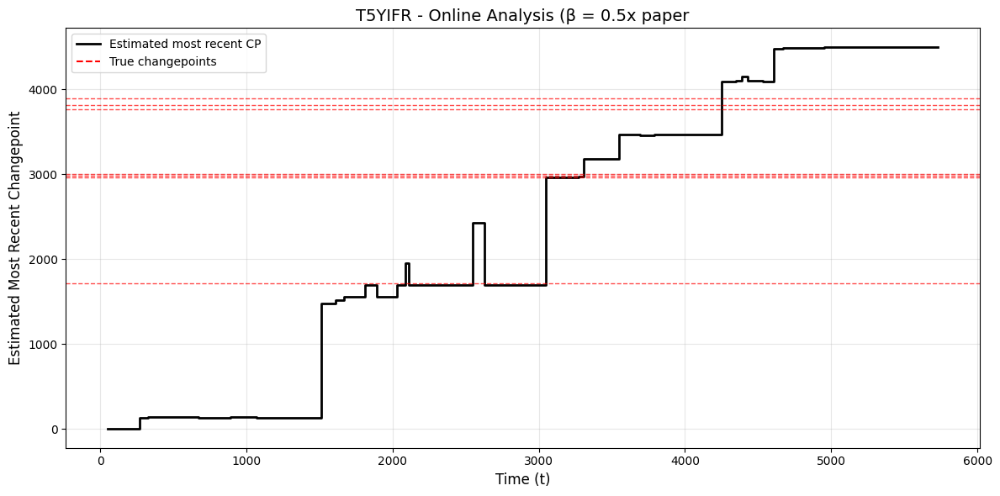

In [82]:
# =============================================================================
# ONLINE ANALYSIS AVEC PARAMÈTRES DE LA CV
# =============================================================================

col = 'T5YIFR'  # ou la colonne que tu veux
loss = 'biweight'

# Récupérer les paramètres optimaux de la CV
cv_result = real_data_cv_results[col][loss]
best_beta = cv_result['best_beta']
best_K = cv_result['best_K']

print(f"Paramètres CV: beta={best_beta:.4f}, K={best_K:.4f}")

# Préparer les données
y = df[col].dropna()
y = y[y.index > '2000']

# Lancer l'online analysis avec les bons paramètres
online_result = online_most_recent_changepoint(
    y.values,
    loss=loss,
    beta=best_beta,  # Beta de la CV
    K=best_K,        # K de la CV
    step=20,
    min_obs=50
)

# Obtenir les "vrais" changepoints (depuis la CV)
true_changepoints = [cp for cp in cv_result['changepoints'] if cp > 0][:-1]

print(f"True changepoints: {true_changepoints}")

# Plot lissé avec vrais changepoints
t_vals = online_result['t_values']

fig, ax = plt.subplots(figsize=(12, 6))
ax.step(t_vals, recent_cp, where='post', linewidth=2, color='black', 
        label='Estimated most recent CP')

for cp in true_changepoints:
    ax.axhline(y=cp, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.plot([], [], color='red', linestyle='--', label='True changepoints')

ax.set_xlabel('Time (t)', fontsize=12)
ax.set_ylabel('Estimated Most Recent Changepoint', fontsize=12)
beta_mult = best_beta / cv_result['paper_params']['beta']
ax.set_title(f'{col} - Online Analysis (β = {beta_mult:.1f}x paper', fontsize=14)
ax.legend(loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Paramètres CV: beta=2.1614, K=0.0085


Online analysis (huber):   1%|▏         | 4/285 [00:00<00:08, 35.06it/s]

Online analysis (huber): 100%|██████████| 285/285 [14:50<00:00,  3.12s/it]


True changepoints: [2977, 2978, 2979, 2983, 2984, 2986, 4555]


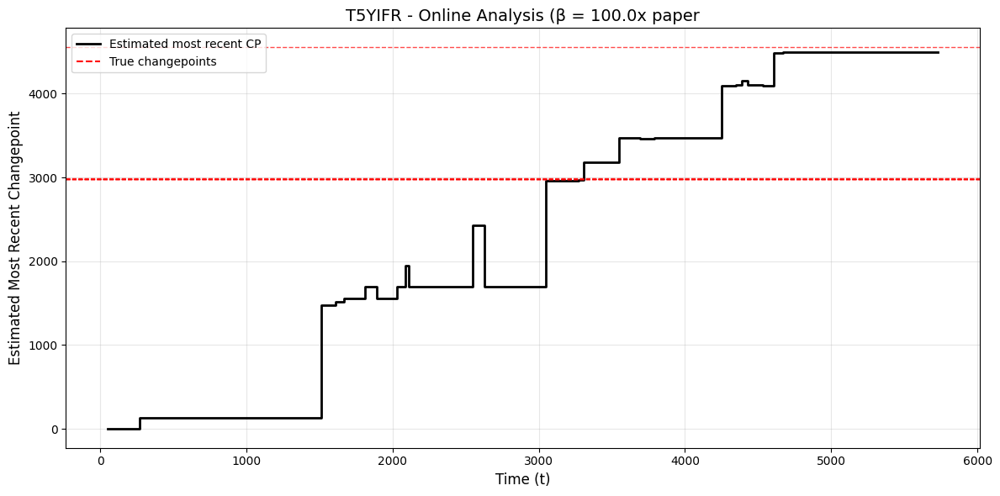

In [83]:
# =============================================================================
# ONLINE ANALYSIS AVEC PARAMÈTRES DE LA CV
# =============================================================================

col = 'T5YIFR'  
loss = 'huber'

# Récupérer les paramètres optimaux de la CV
cv_result = real_data_cv_results[col][loss]
best_beta = cv_result['best_beta']
best_K = cv_result['best_K']

print(f"Paramètres CV: beta={best_beta:.4f}, K={best_K:.4f}")

# Préparer les données
y = df[col].dropna()
y = y[y.index > '2000']

# Lancer l'online analysis avec les bons paramètres
online_result = online_most_recent_changepoint(
    y.values,
    loss=loss,
    beta=best_beta,  # Beta de la CV
    K=best_K,        # K de la CV
    step=20,
    min_obs=50
)

# Obtenir les "vrais" changepoints (depuis la CV)
true_changepoints = [cp for cp in cv_result['changepoints'] if cp > 0][:-1]

print(f"True changepoints: {true_changepoints}")

# Plot lissé avec vrais changepoints
t_vals = online_result['t_values']

fig, ax = plt.subplots(figsize=(12, 6))
ax.step(t_vals, recent_cp, where='post', linewidth=2, color='black', 
        label='Estimated most recent CP')

for cp in true_changepoints:
    ax.axhline(y=cp, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.plot([], [], color='red', linestyle='--', label='True changepoints')

ax.set_xlabel('Time (t)', fontsize=12)
ax.set_ylabel('Estimated Most Recent Changepoint', fontsize=12)
beta_mult = best_beta / cv_result['paper_params']['beta']
ax.set_title(f'{col} - Online Analysis (β = {beta_mult:.1f}x paper', fontsize=14)
ax.legend(loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### GDP

Série: CLVMNACSCAB1GQEA19, n = 123
Beta paper: 899687832.0000
Beta utilisé (x12): 899687832.0000
K: 4072.0000


Online analysis (huber): 100%|██████████| 122/122 [00:00<00:00, 692.87it/s]

True changepoints: [52, 107]


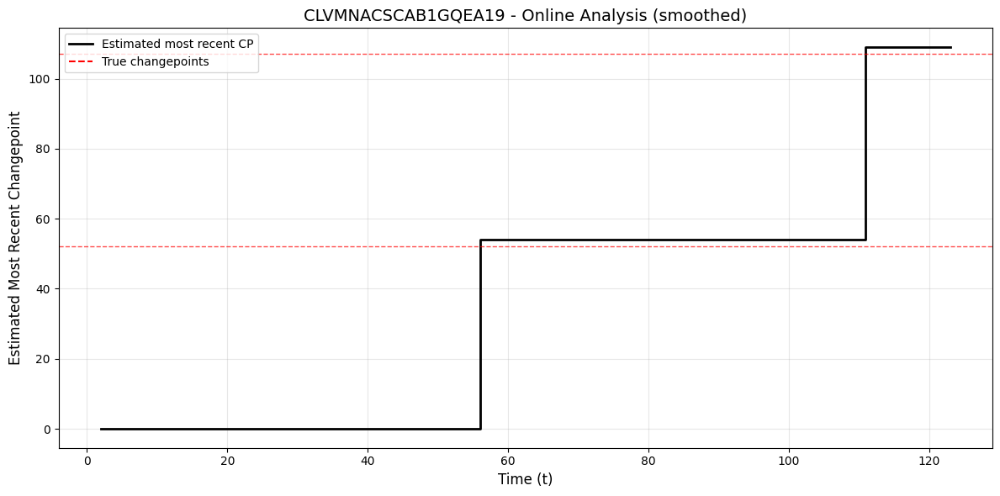

In [99]:
# =============================================================================
# ONLINE ANALYSIS - GDP
# =============================================================================

col = 'CLVMNACSCAB1GQEA19'

# Préparer les données
y = df[col].dropna()

print(f"Série: {col}, n = {len(y)}")

# Calculer beta et K avec le scaling
beta_paper = 899687832
K = 4072

beta = beta_paper  

print(f"Beta paper: {beta_paper:.4f}")
print(f"Beta utilisé (x12): {beta:.4f}")
print(f"K: {K:.4f}")

# Online analysis
online_result = online_most_recent_changepoint(
    y.values,
    loss='huber',
    beta = beta,
    K = K,
    step=1,
    min_obs=2
)


# Obtenir les "vrais" changepoints (algo sur données complètes)
gamma_builder = lambda y_t, t, K=K: gamma_builder_huber(y_t, K, t)
cp_tau, _, _ = rfpop_algorithm1_main(list(y.values), gamma_builder, beta)

# Extraction des changepoints
true_changepoints = []
idx = len(y) - 1
while idx > 0:
    tau = cp_tau[idx]
    if tau > 0:
        true_changepoints.append(tau - 2)
    idx = tau
true_changepoints = sorted([cp for cp in true_changepoints if cp > 0]) 
true_changepoints = true_changepoints

print(f"True changepoints: {true_changepoints}")

# Plot lissé avec vrais changepoints
t_vals = online_result['t_values']
recent_cp = online_result['most_recent_cp']  # Lissage

fig, ax = plt.subplots(figsize=(12, 6))
ax.step(t_vals, recent_cp, where='post', linewidth=2, color='black', 
        label='Estimated most recent CP')

for cp in true_changepoints:
    ax.axhline(y=cp, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.plot([], [], color='red', linestyle='--', label='True changepoints')

ax.set_xlabel('Time (t)', fontsize=12)
ax.set_ylabel('Estimated Most Recent Changepoint', fontsize=12)
ax.set_title(f'{col} - Online Analysis (smoothed)', fontsize=14)
ax.legend(loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

